In [21]:
import time
from typing import Any, Dict, List, Tuple, Union

import argparse
import joblib
import tensorflow as tf
from termcolor import cprint
import numpy as np
import pickle as pkl
import torch
import torch.nn as nn
import torch.nn.functional as F
import utils.baseline_utils as baseline_utils
from lstm_train_test import *

In [183]:
import pickle
import torch
import sys
import os
import numpy as np
from train_utils import *
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.patches import Ellipse
from evaluate_network import evaluate
from datasets.argoverse_lane_loader import read_pkl_data
from argoverse.map_representation.map_api import ArgoverseMap
import pandas as pd
sys.path.append('..')
import seaborn as sns

from datasets import helper

from tqdm import tqdm
import pickle
from collections import defaultdict
from typing import Dict, Optional
from datasets.argoverse_lane_loader import read_pkl_data
from argoverse.data_loading.argoverse_forecasting_loader import ArgoverseForecastingLoader
from argoverse.map_representation.map_api import ArgoverseMap

In [3]:
device = 'cuda'

In [200]:
encoder = EncoderRNN(input_size=2)
decoder = DecoderRNN(output_size=5)
encoder = nn.DataParallel(encoder)
decoder = nn.DataParallel(decoder)
encoder.to(device)
decoder.to(device)

encoder_optimizer = torch.optim.Adam(encoder.parameters())
decoder_optimizer = torch.optim.Adam(decoder.parameters())

model_utils = ModelUtils()

model_path = '../checkpoints/lstmfixed/LSTM_rollout30.pth.tar'
epoch, rollout_len, _ = model_utils.load_checkpoint(
            model_path, encoder, decoder, encoder_optimizer,
            decoder_optimizer)

=> loading checkpoint '../checkpoints/lstmfixed/LSTM_rollout30.pth.tar'
=> loaded checkpoint ../checkpoints/lstmfixed/LSTM_rollout30.pth.tar (epoch: 556, loss: 3.4132704734802246)


In [202]:
dataset_path = '../../argoverse_data'
val_path = os.path.join(dataset_path, 'val') #, 'lane_data'
val_dataset = read_pkl_data(val_path, batch_size=1, shuffle=False, repeat=False)

found


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


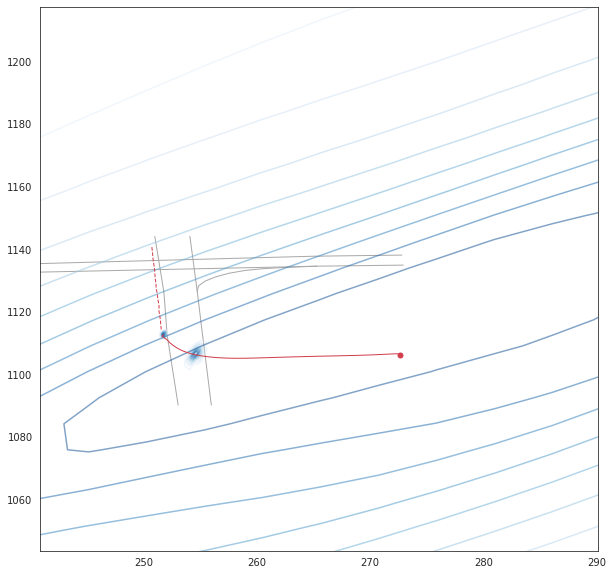

In [196]:
for valdata in val_dataset:
    #print(valdata['scene_idx'])
    if valdata['scene_idx'][0]==10279:
        print('found')
        df = lstm_pred(valdata, encoder, decoder)
        preds.append((valdata['scene_idx'],df))
        l = (240.76515197753906, 290.1019287109375, 1043.6497802734375, 1217.4908447265625)
        visualize_trajectory(df, lims=l)
        break

[10002]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


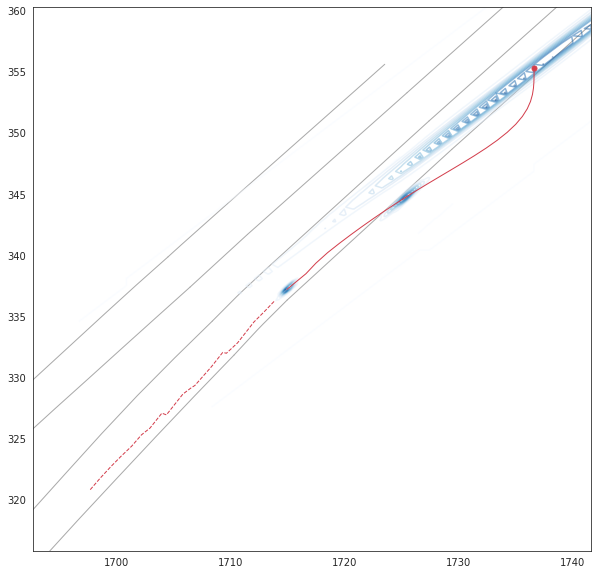

[10019]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


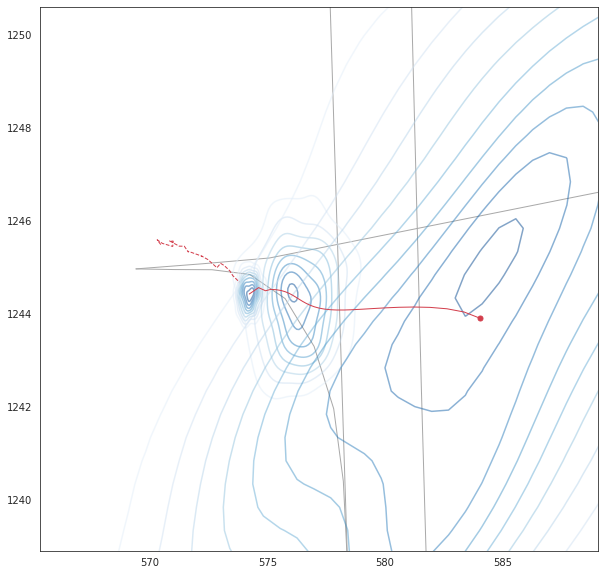

[10028]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


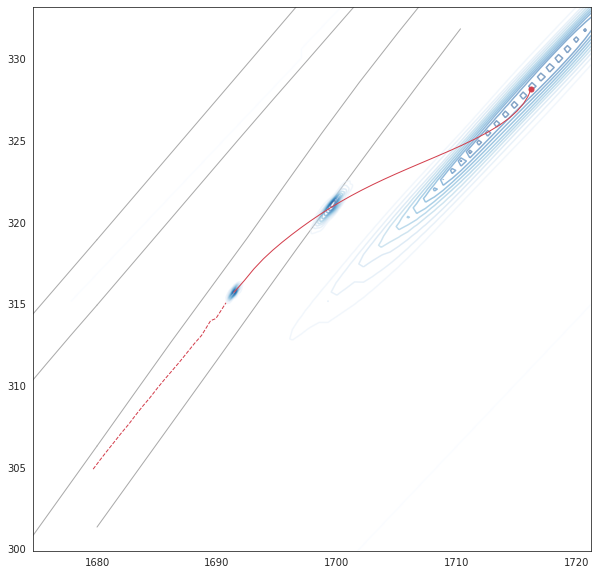

[1003]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


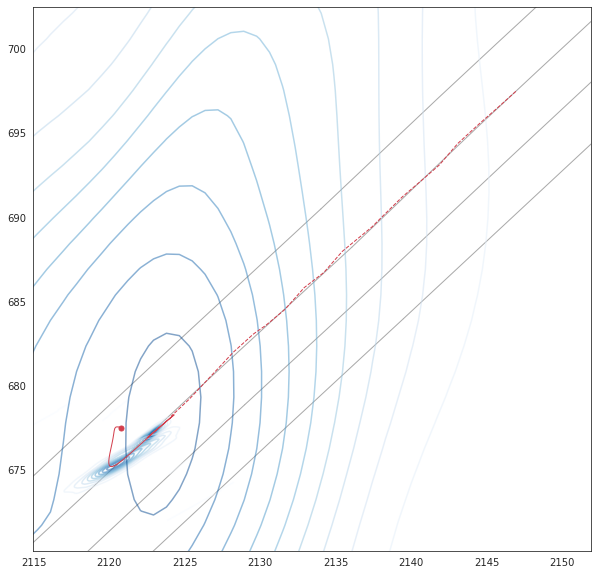

[10069]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


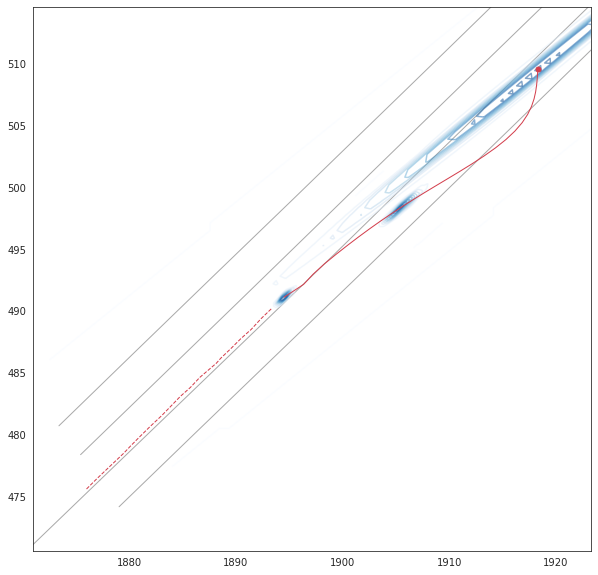

[10075]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


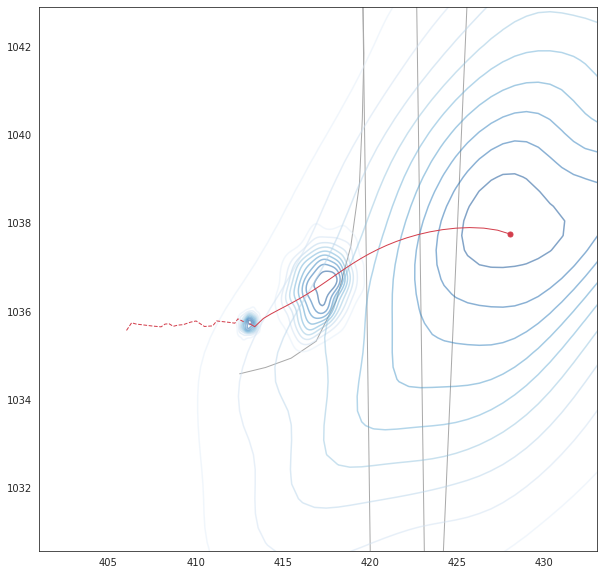

[10078]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


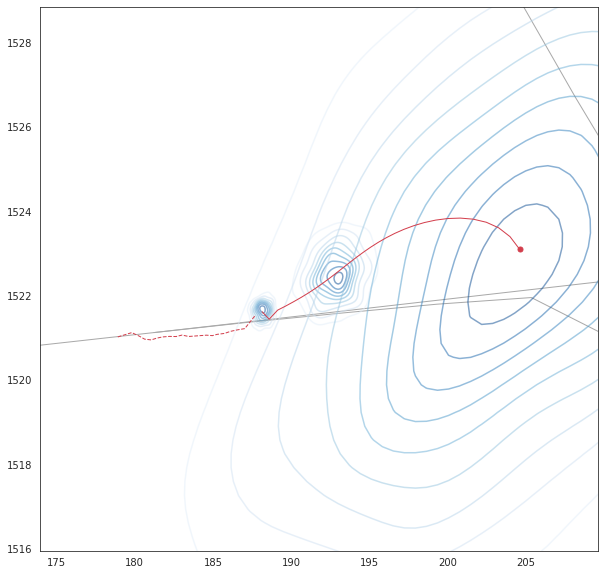

[10082]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


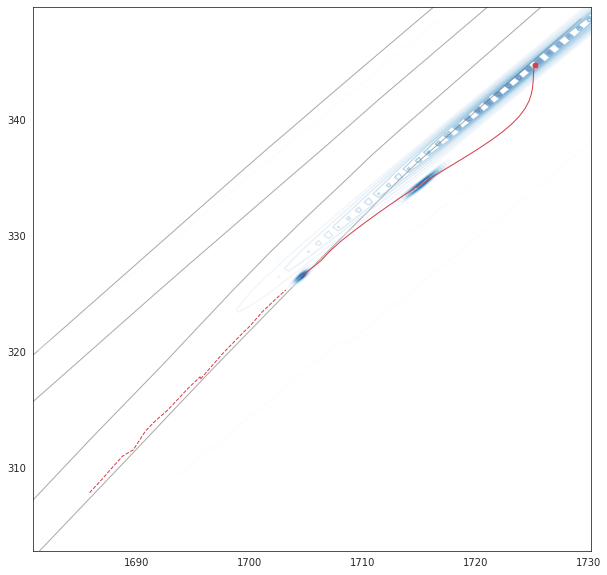

[10095]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


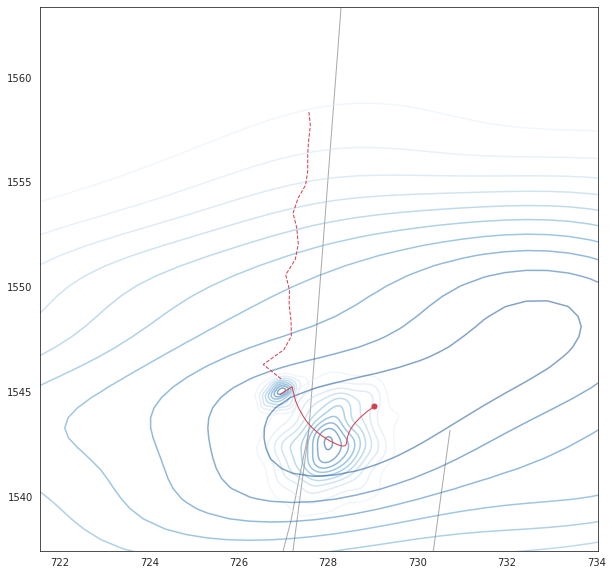

[10116]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


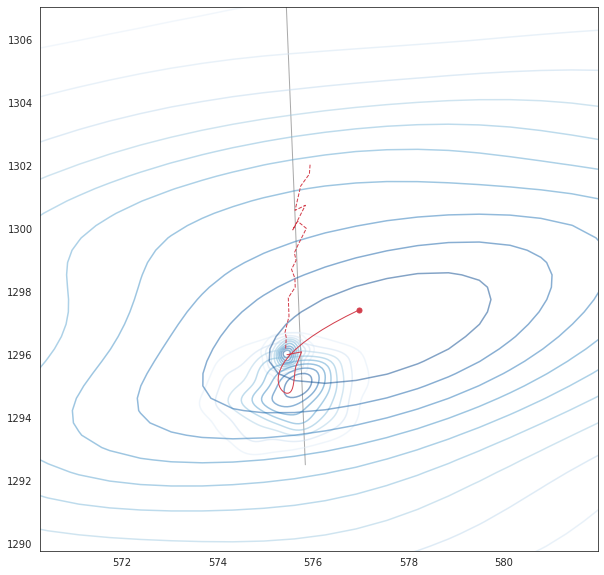

[10161]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


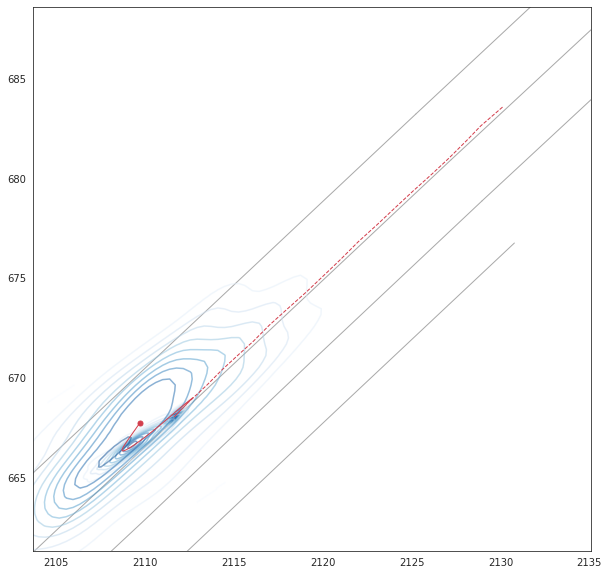

[10165]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


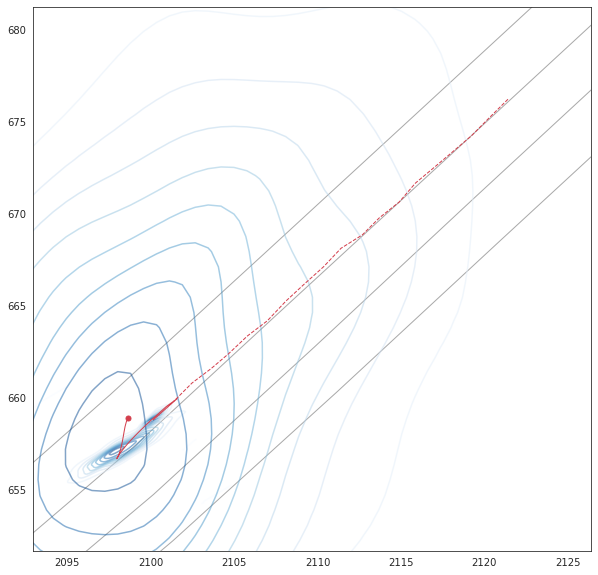

[10189]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


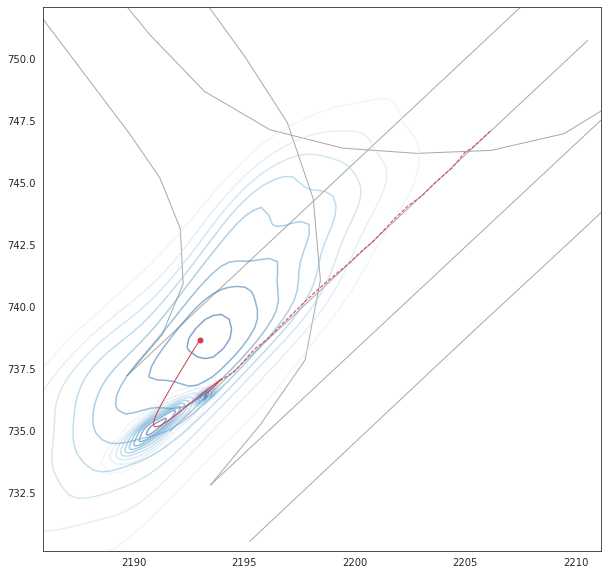

[10196]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


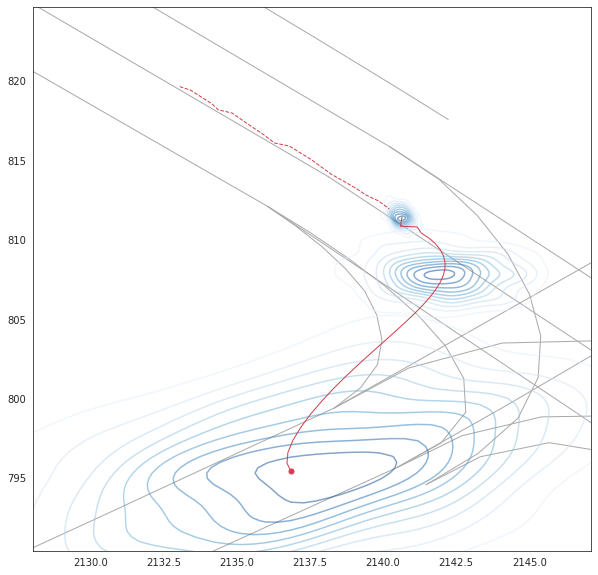

[10200]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


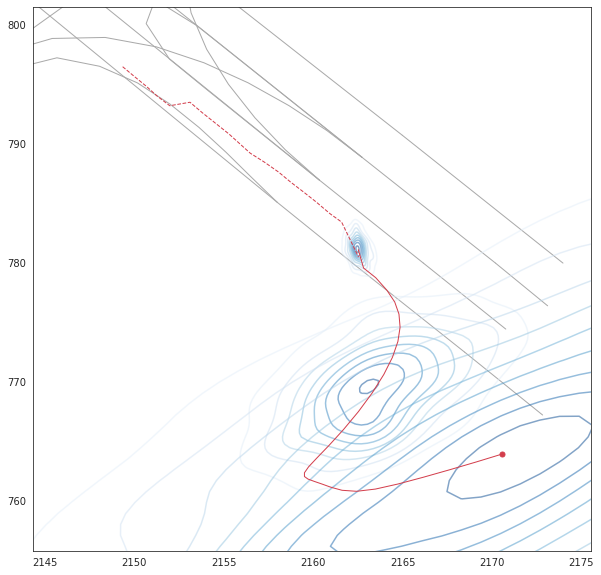

[10214]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


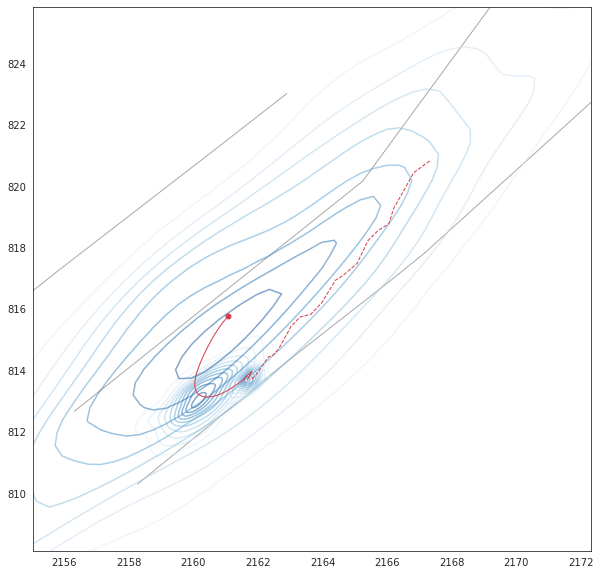

[10219]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


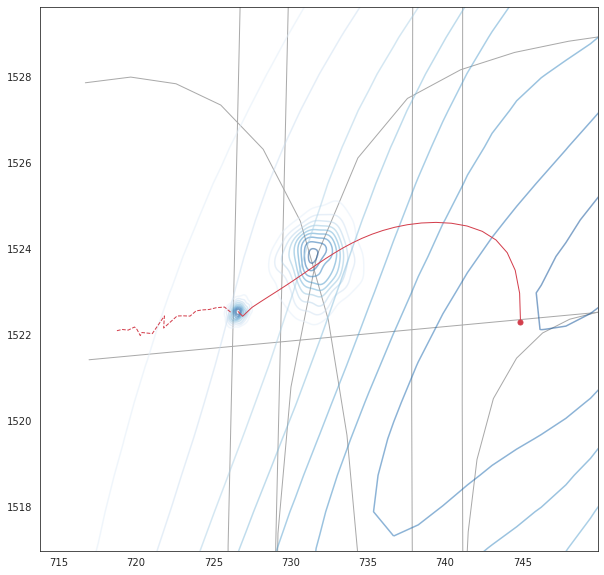

[10232]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


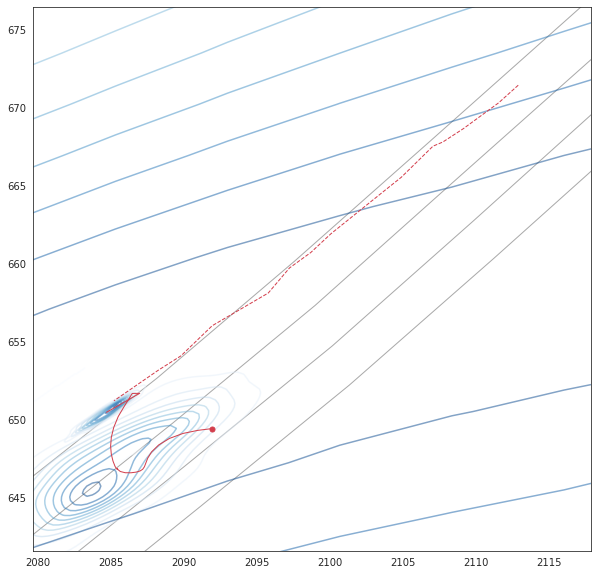

[10240]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


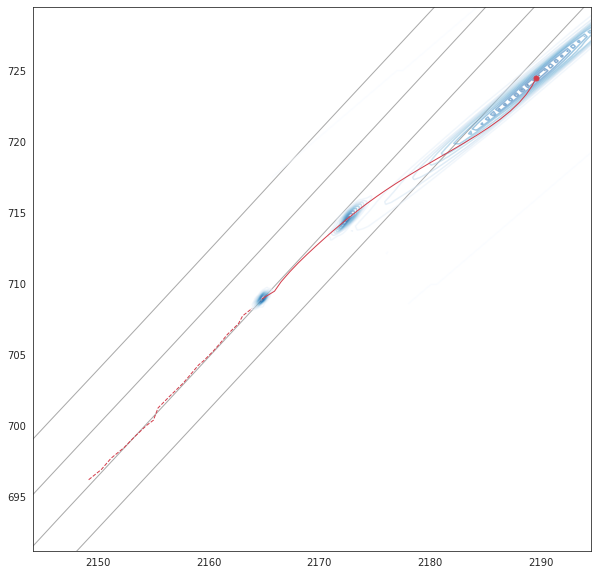

[10242]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


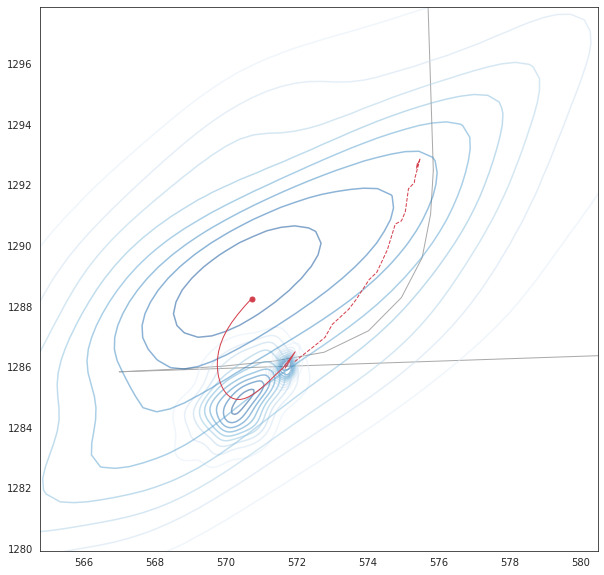

[10250]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


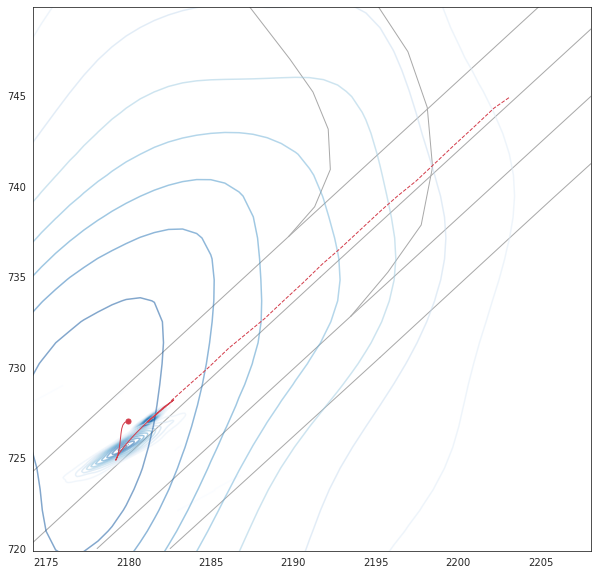

[10251]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


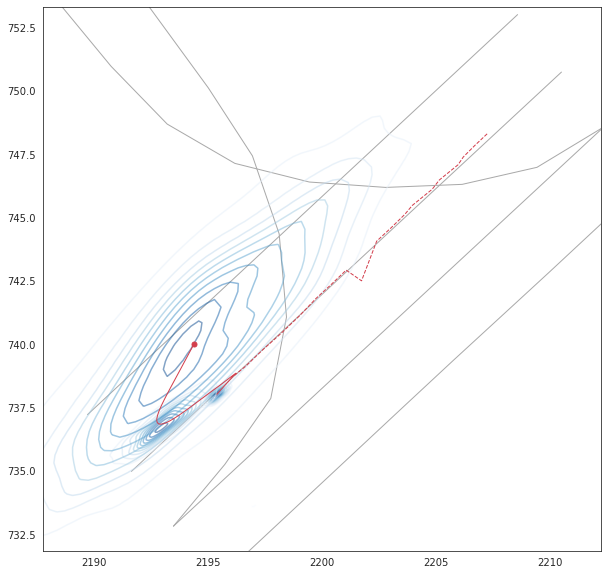

[10278]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


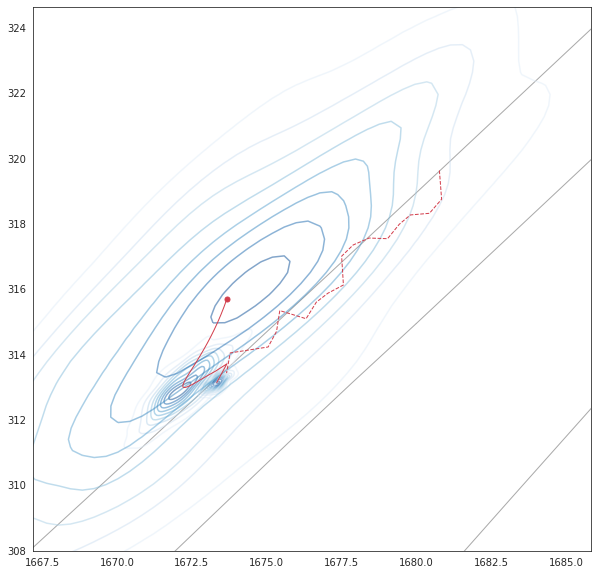

[10279]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


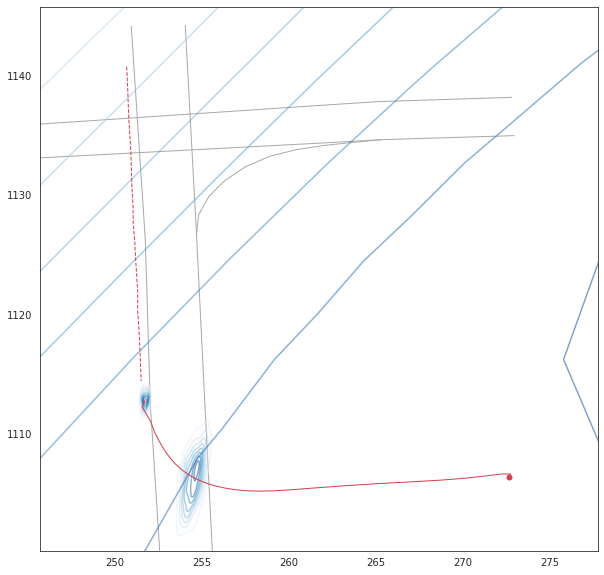

[10281]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


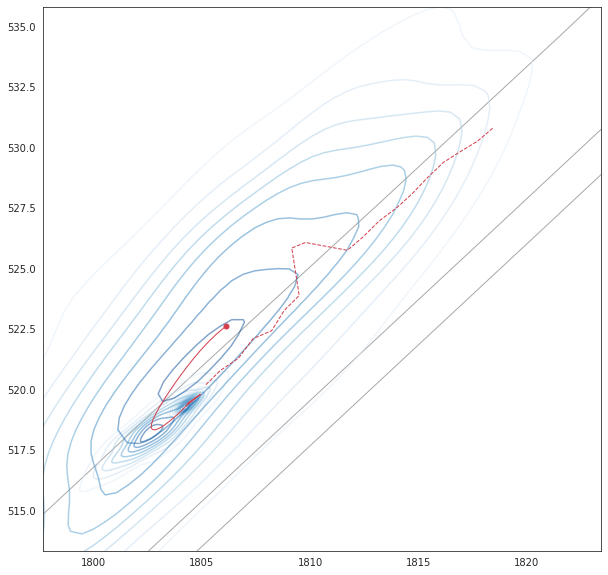

[10298]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


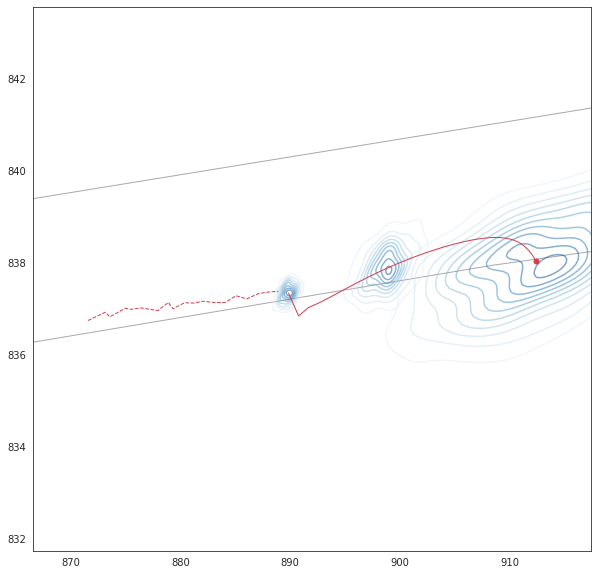

[10303]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


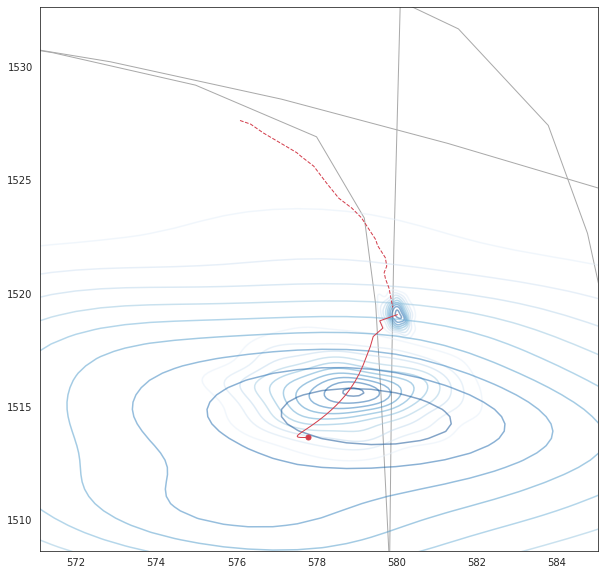

[10312]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


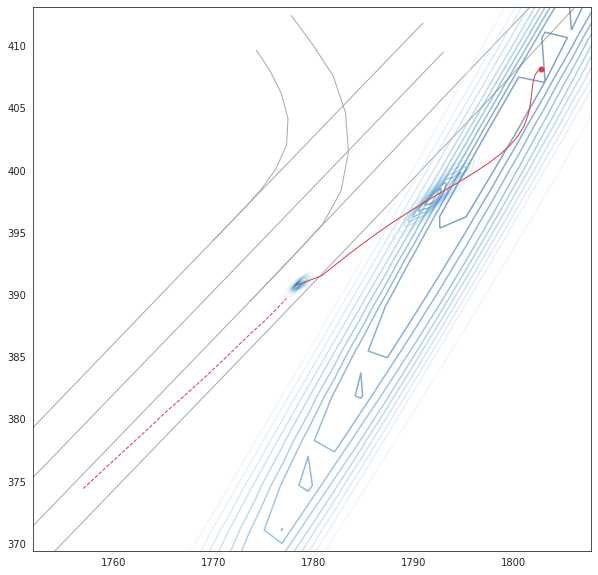

[10313]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


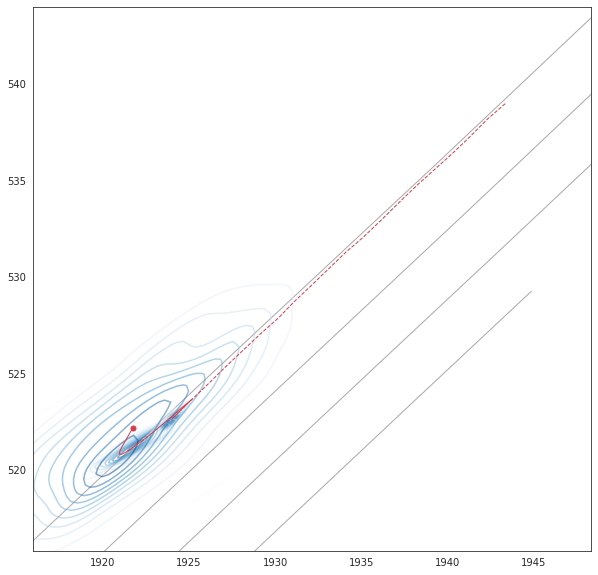

[10317]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


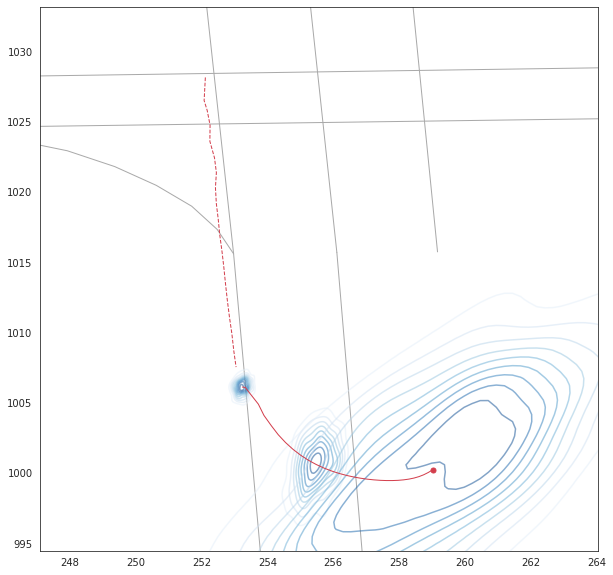

[10340]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


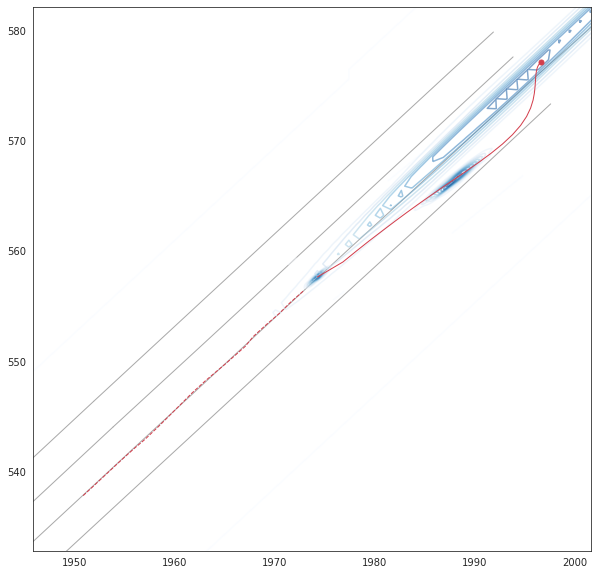

[10355]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


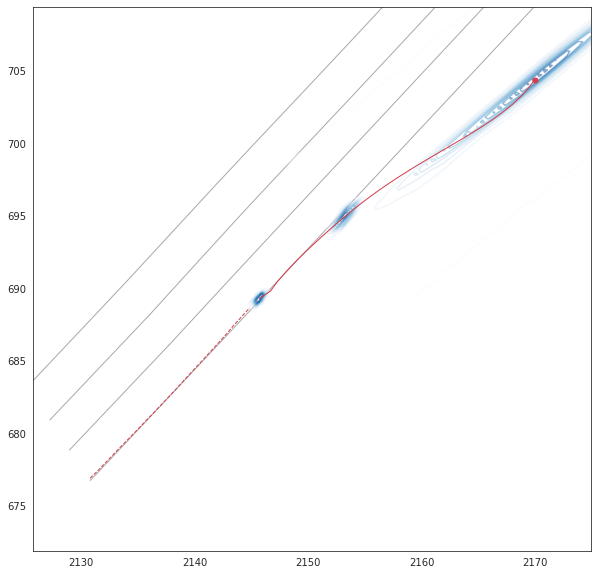

[10357]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


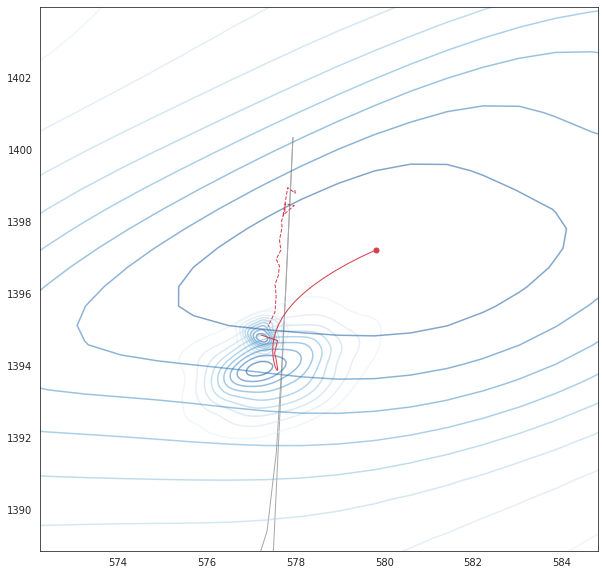

[10360]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


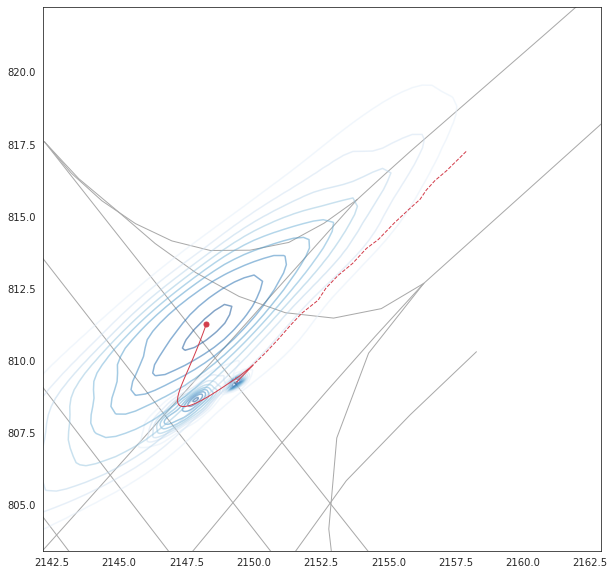

[10374]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


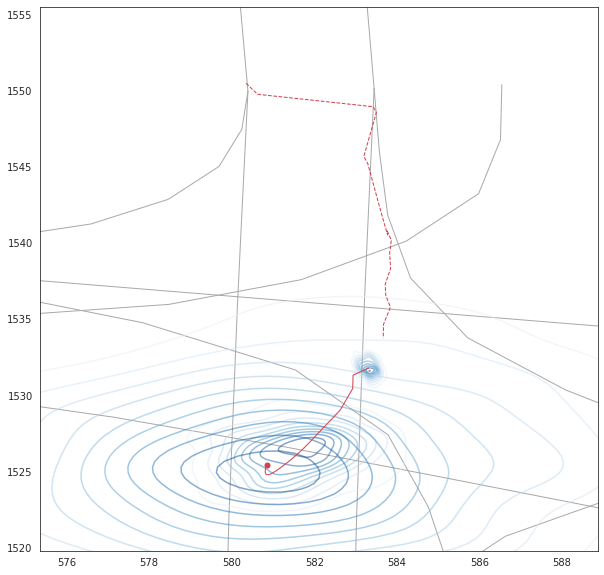

[104]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


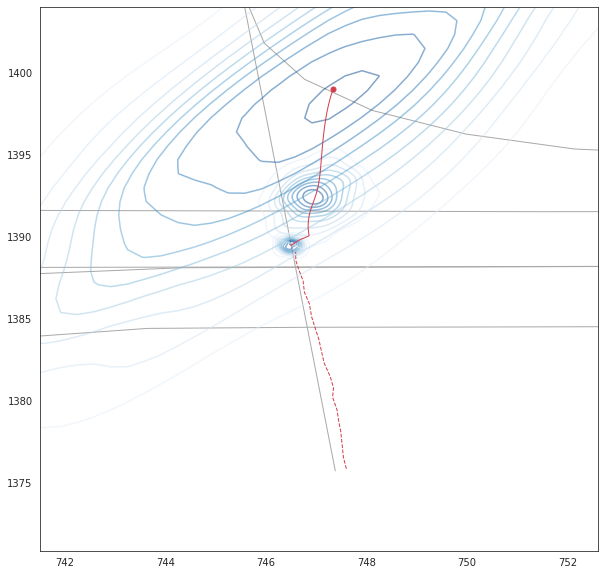

[10413]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


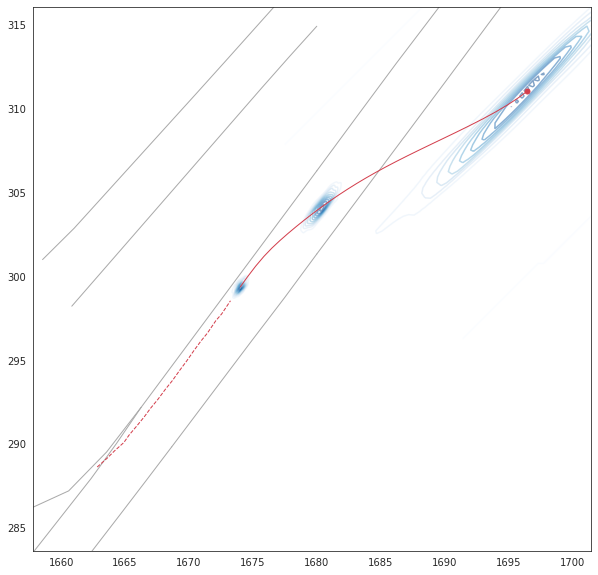

[10439]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


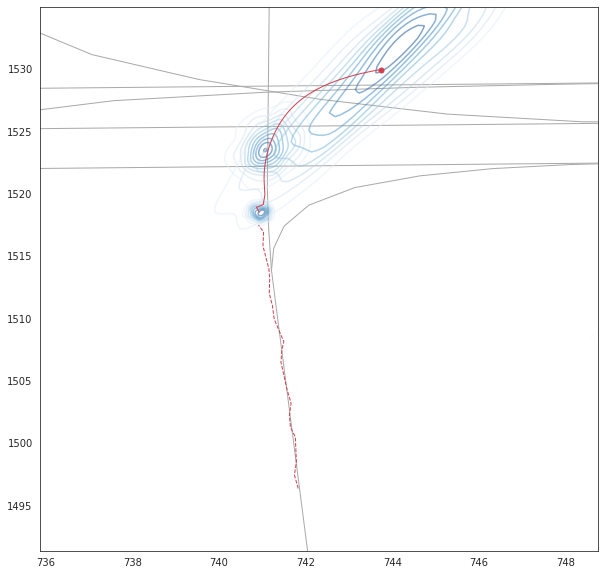

[10449]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


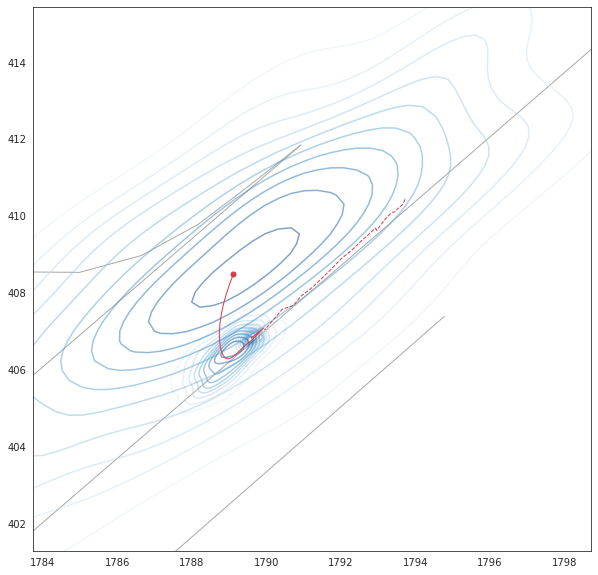

[10467]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


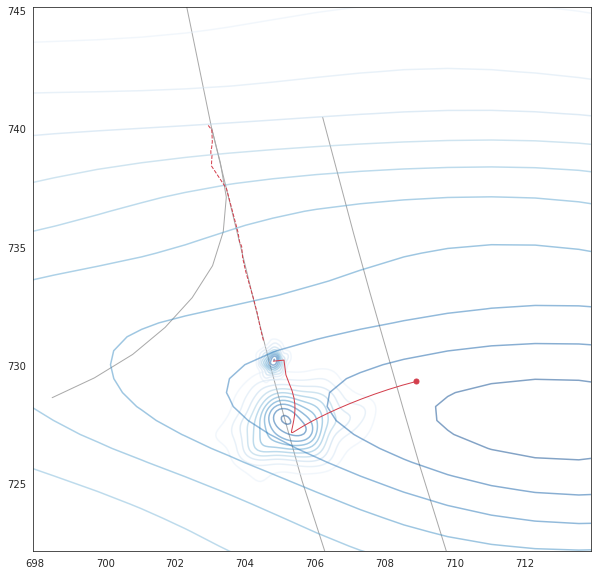

[10472]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


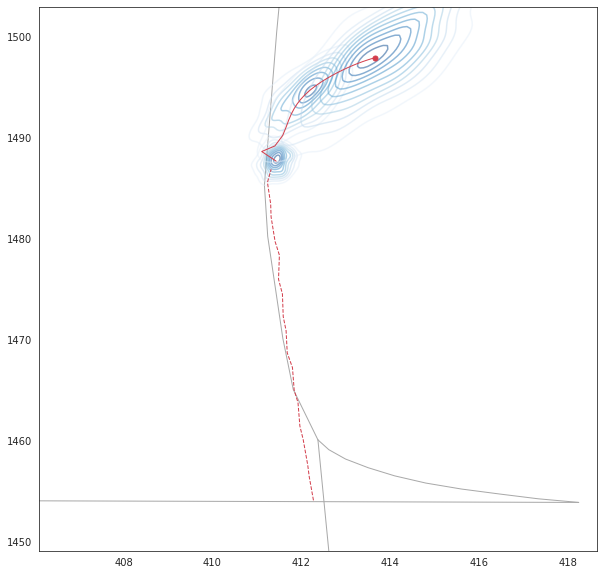

[10474]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


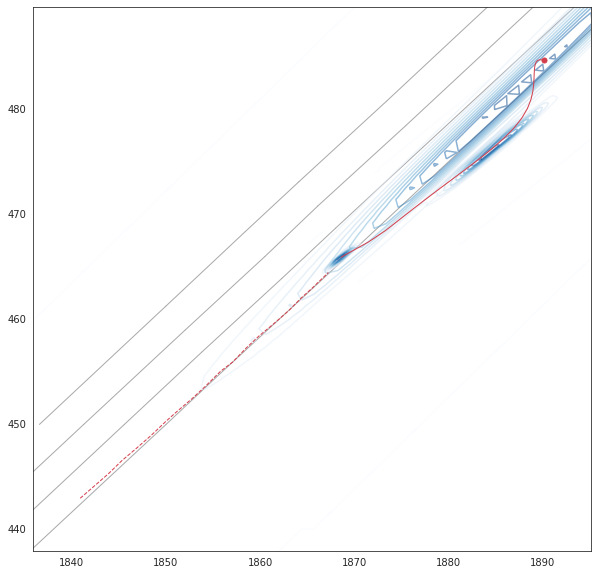

[10487]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


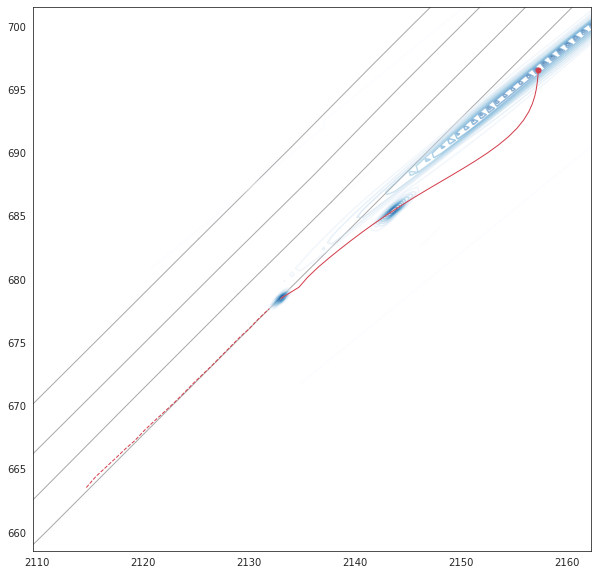

[10495]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


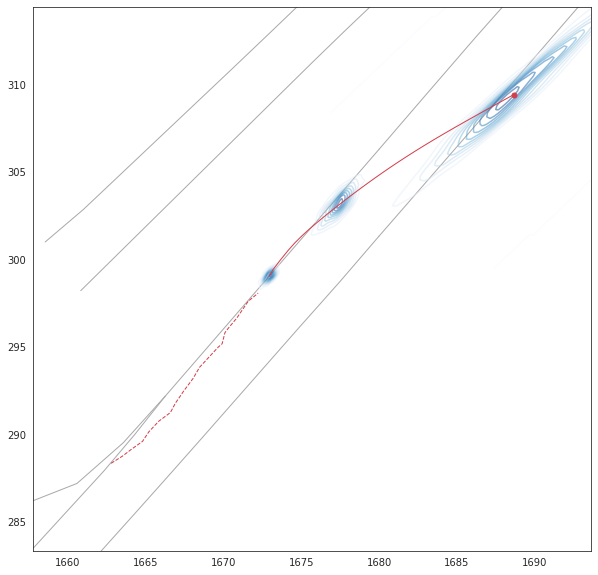

[10517]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


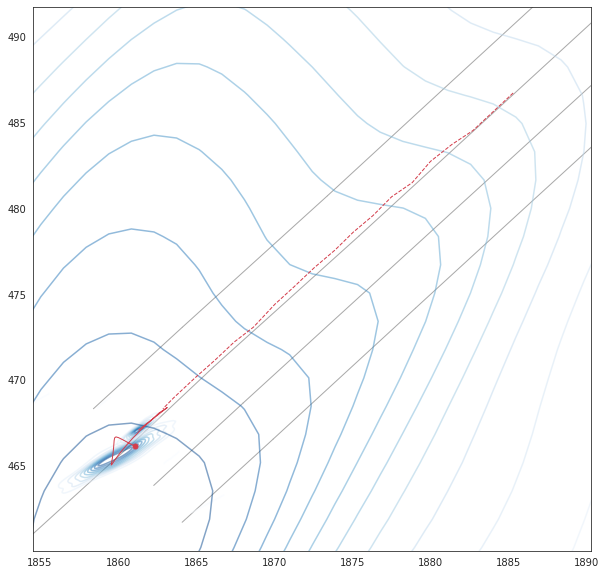

[10521]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


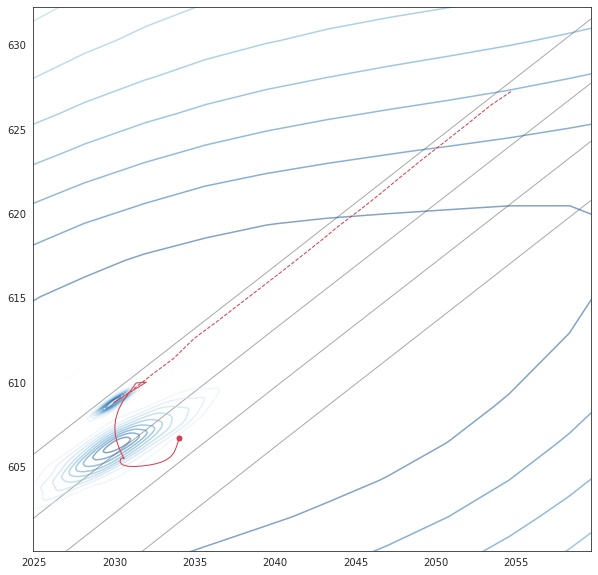

[10523]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


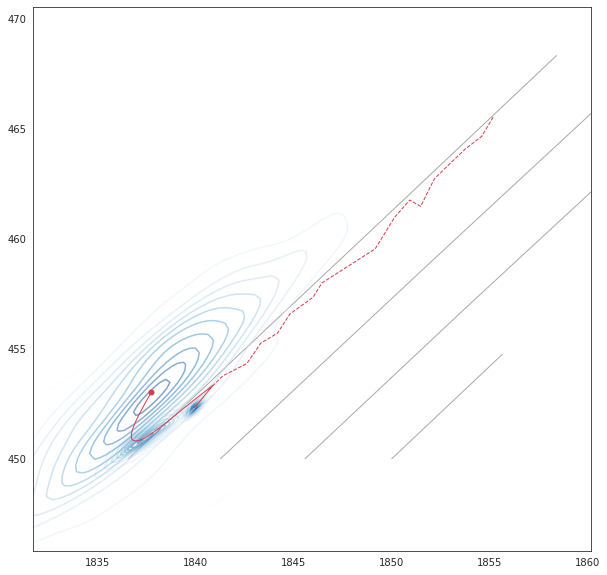

[10535]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


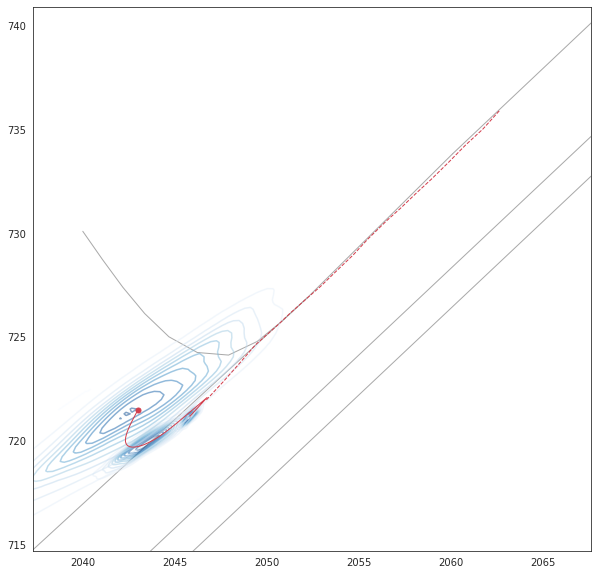

[10545]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


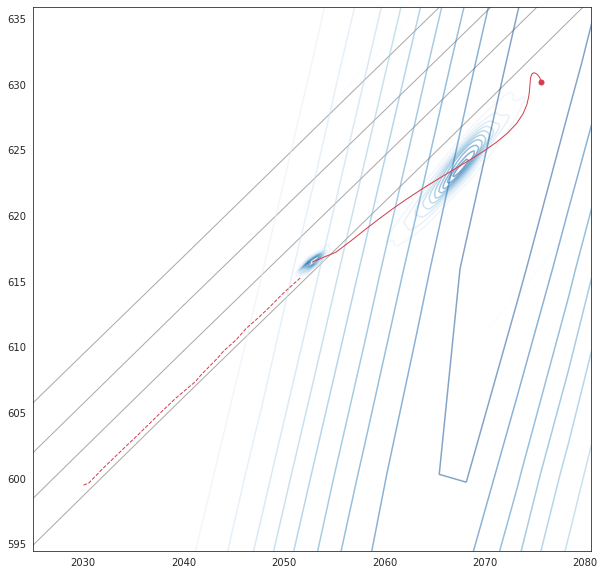

[10560]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


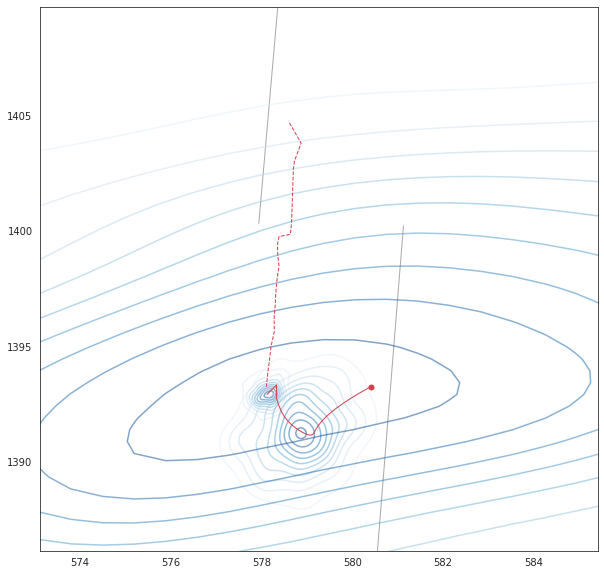

[10561]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


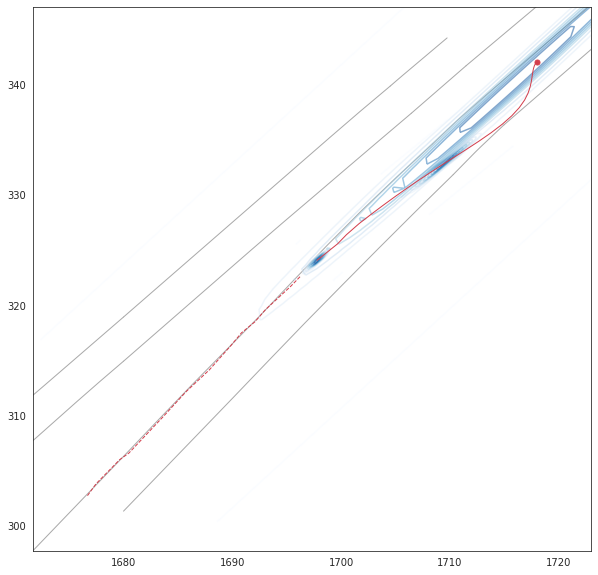

[10589]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


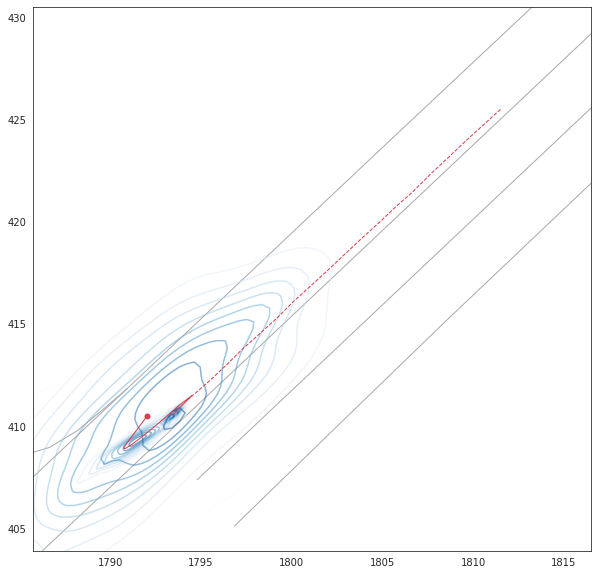

[10605]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


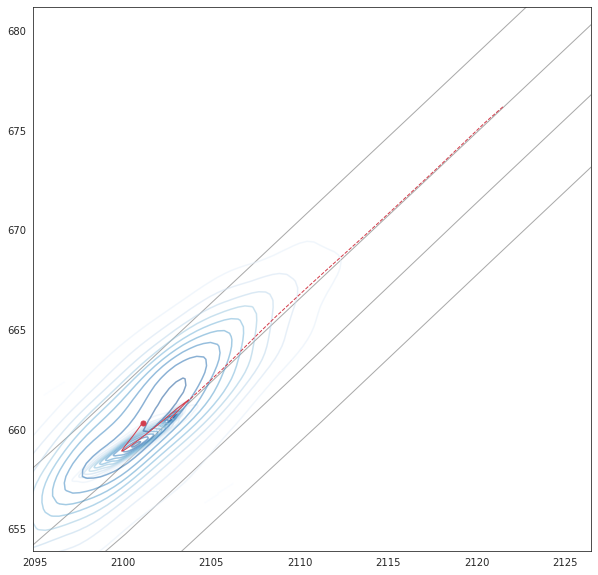

[10646]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


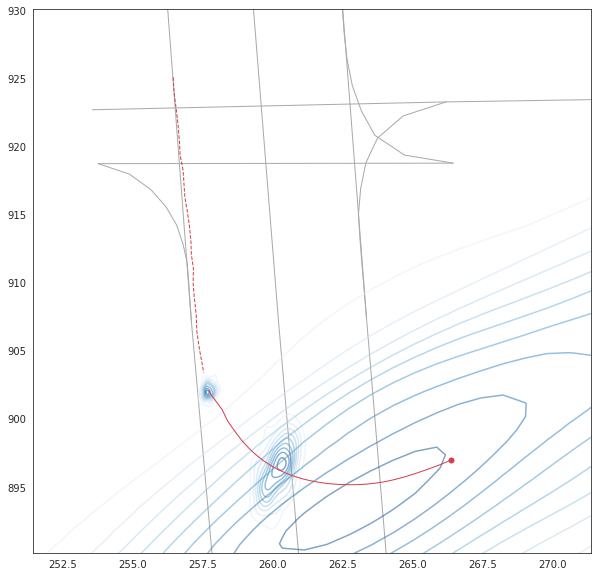

[1065]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


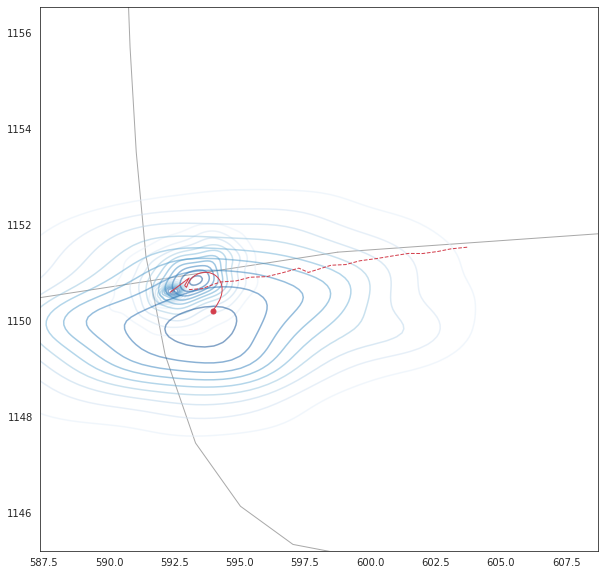

[10662]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


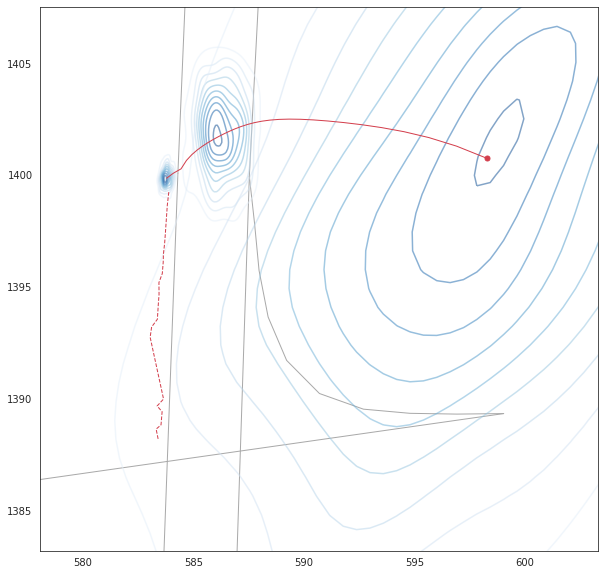

[10693]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


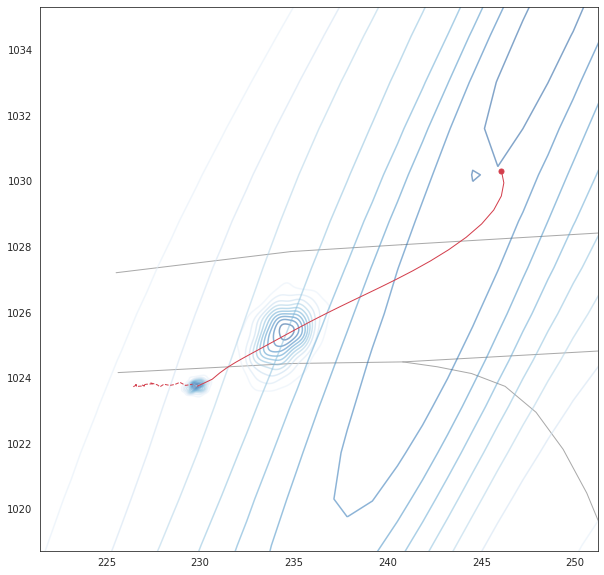

[10699]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


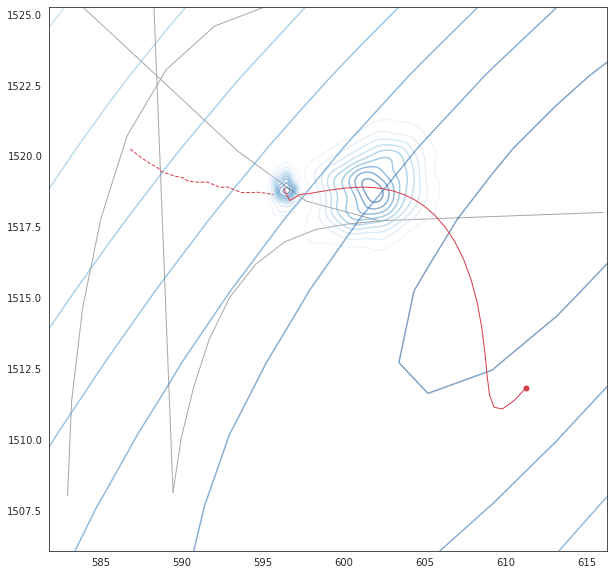

[10701]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


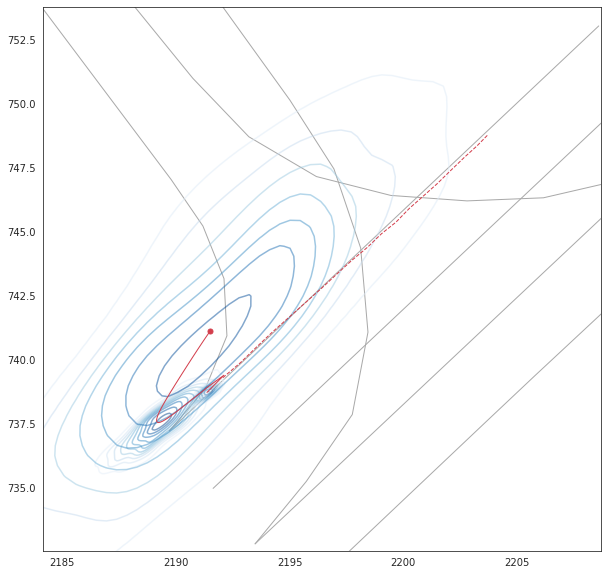

[10705]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


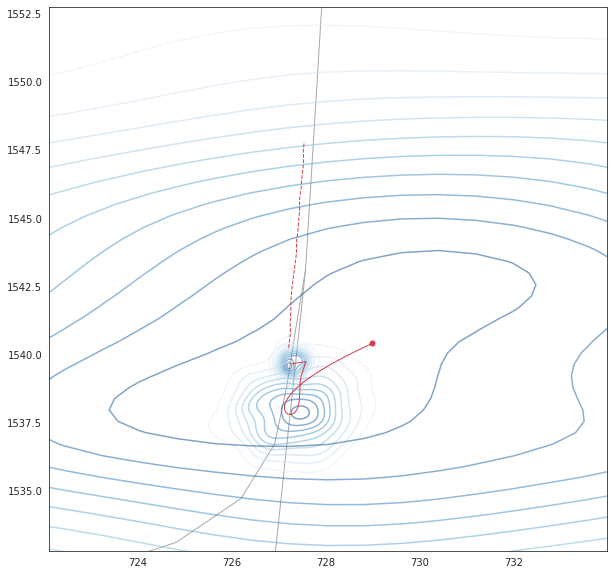

[10750]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


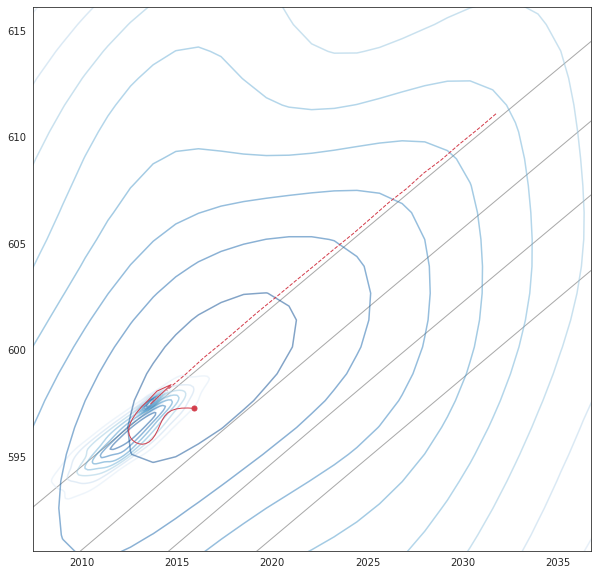

In [203]:
preds = []
i = 0
for valdata in val_dataset:
    i +=1
    df = lstm_pred(valdata, encoder, decoder)
    preds.append((valdata['scene_idx'],df))
    print(valdata['scene_idx'])
    visualize_trajectory(df)
    if i>60:
        break

[10002]
[10002]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


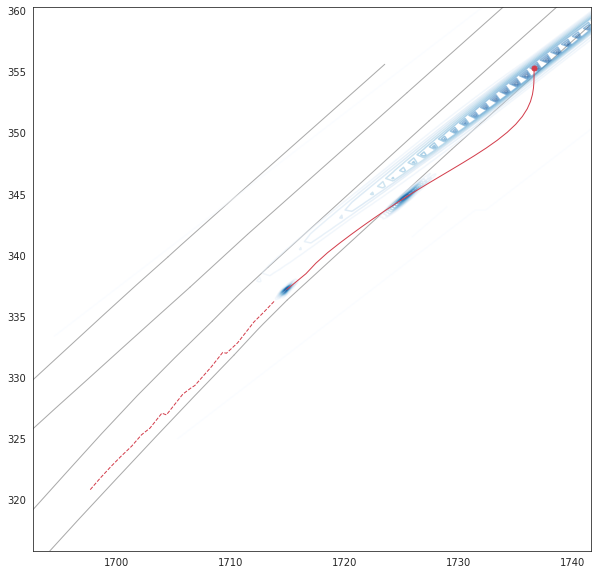

[10019]
[10019]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


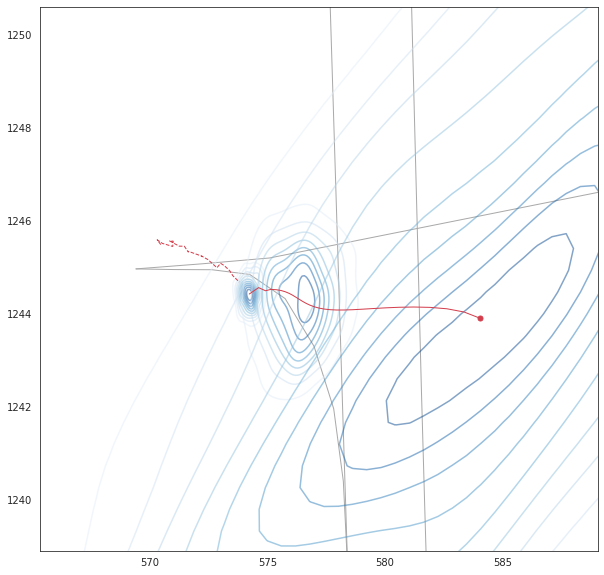

[10028]
[10028]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


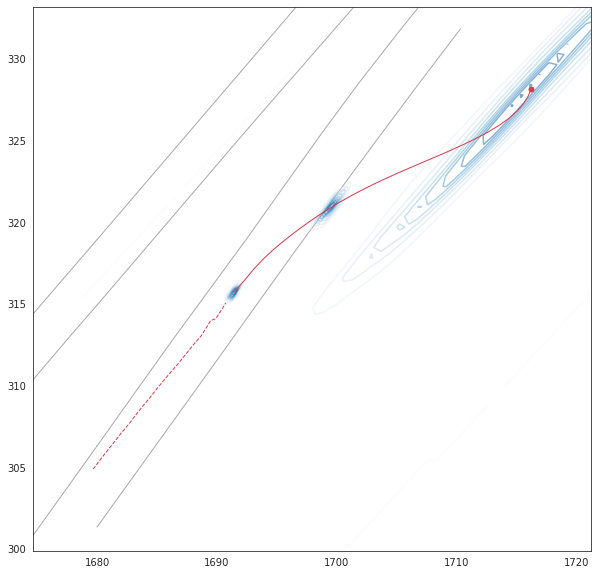

[1003]
[1003]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


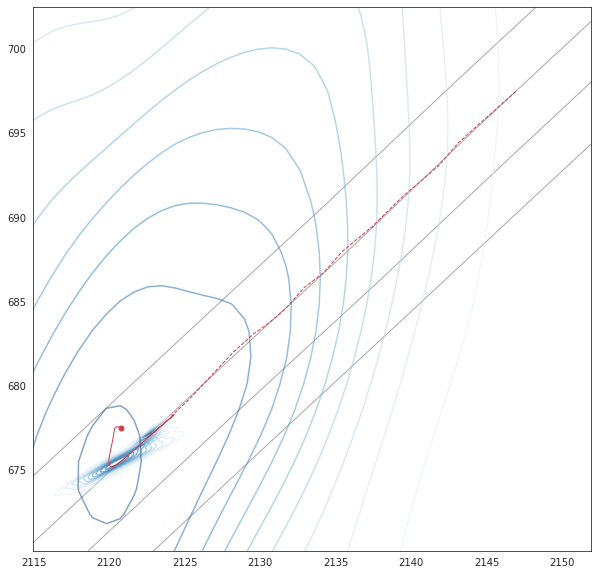

[10069]
[10069]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


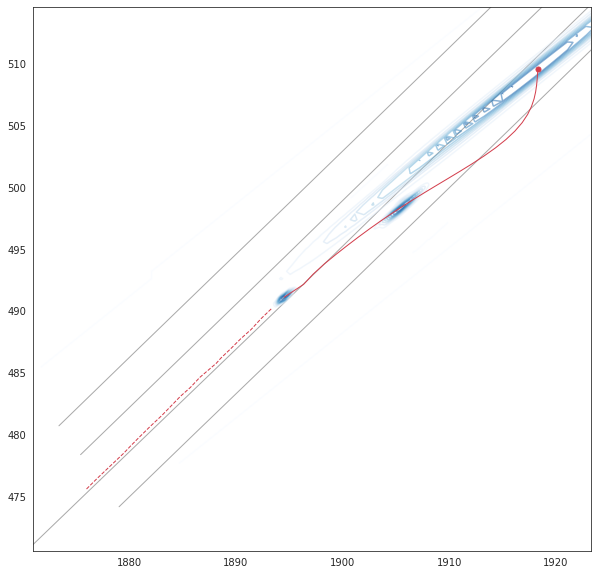

[10075]
[10075]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


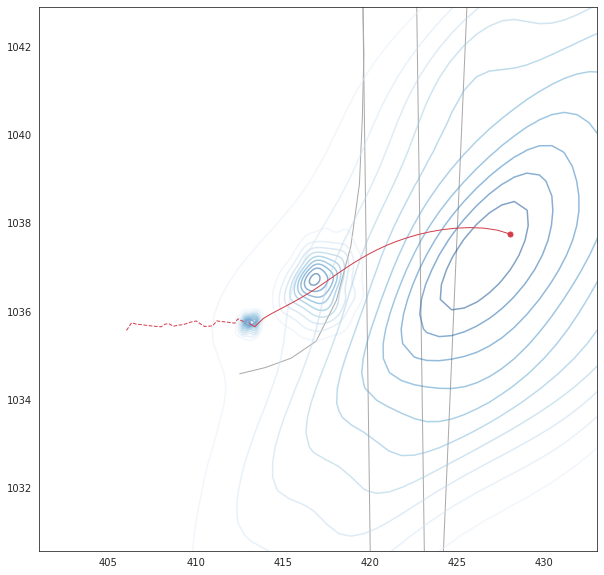

[10078]
[10078]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


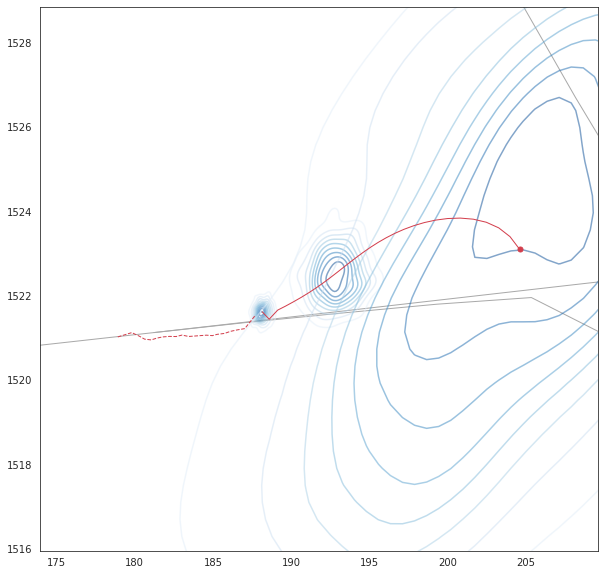

[10082]
[10082]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


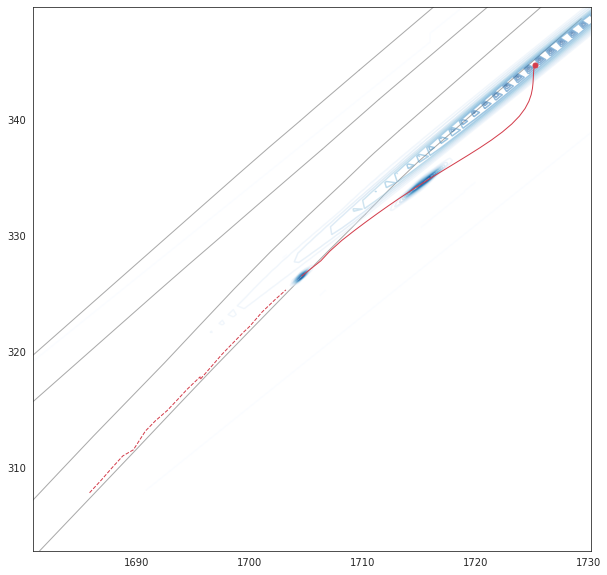

[10095]
[10095]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


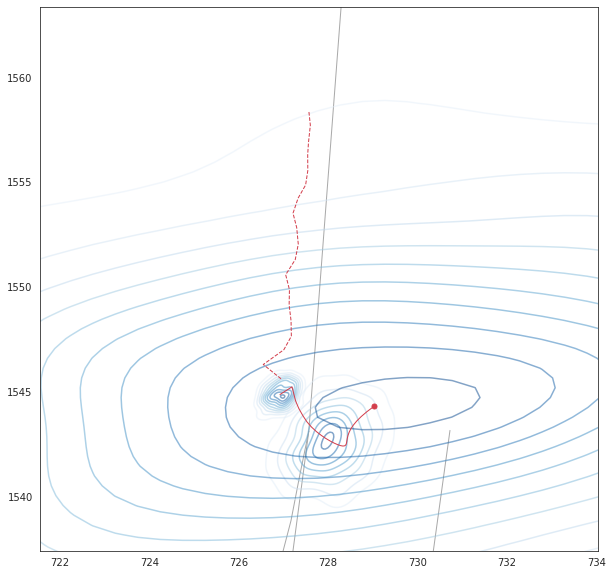

[10116]
[10116]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


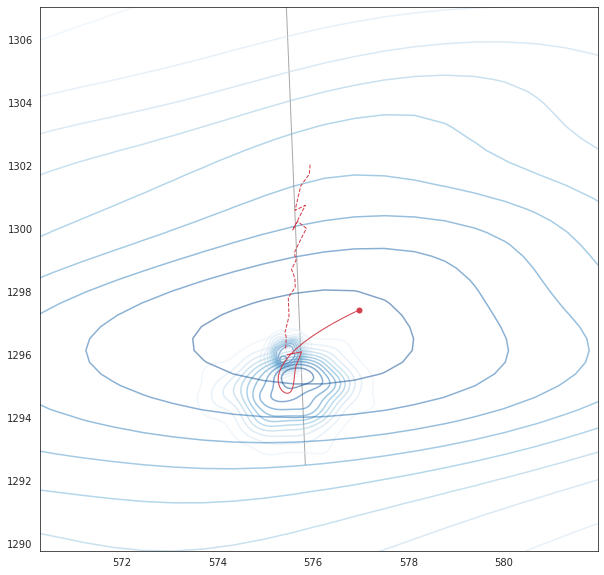

[10161]
[10161]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


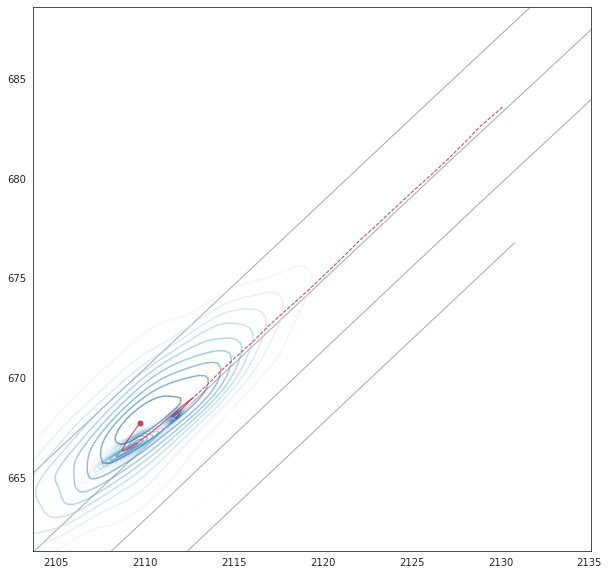

[10165]
[10165]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


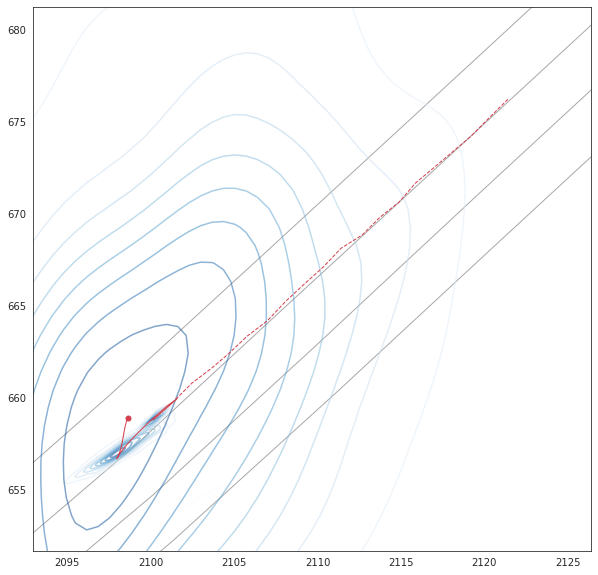

[10189]
[10189]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


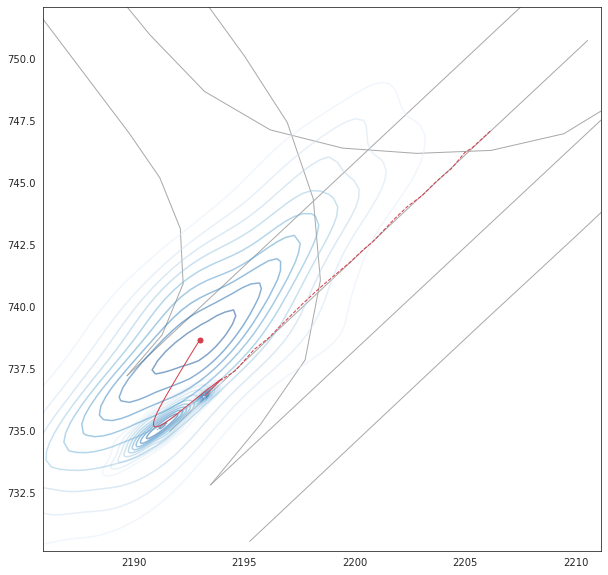

[10196]
[10196]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


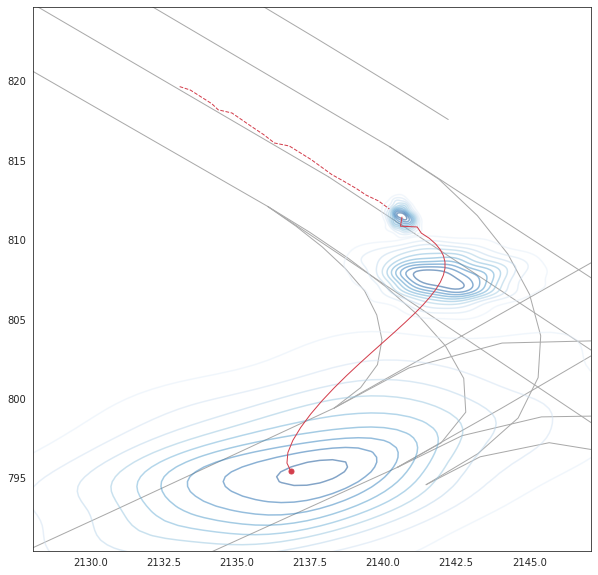

[10200]
[10200]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


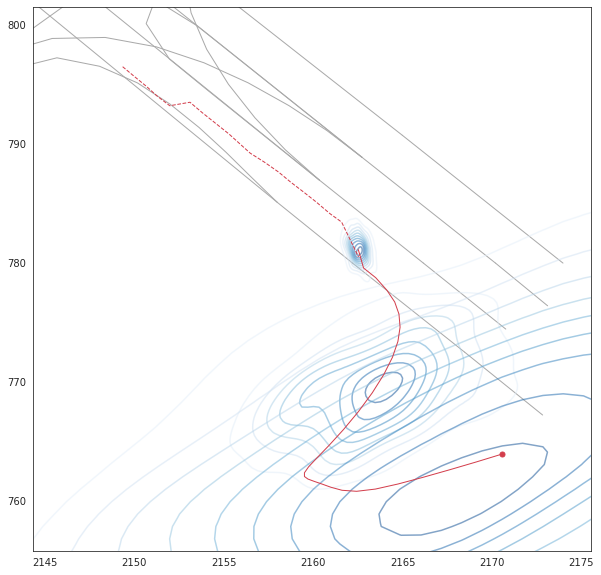

[10214]
[10214]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


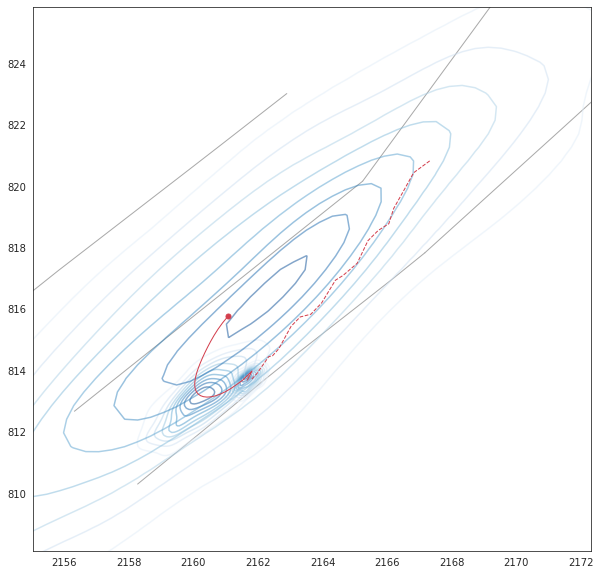

[10219]
[10219]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


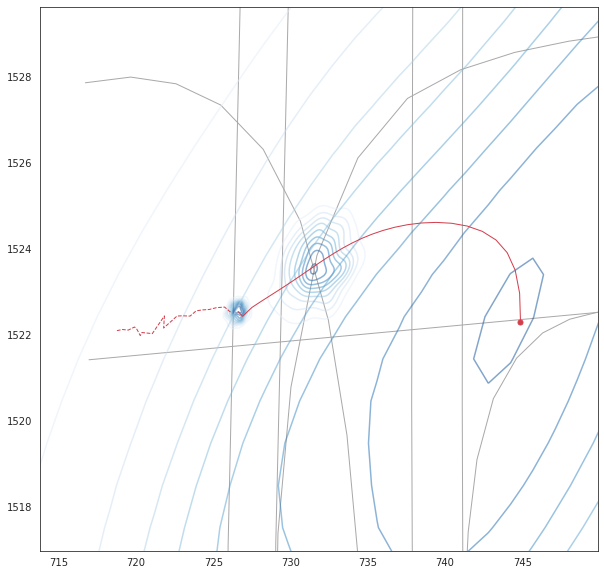

[10232]
[10232]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


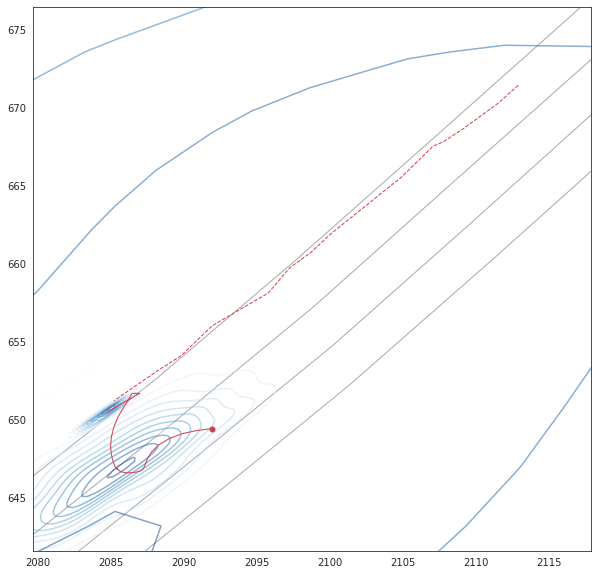

[10240]
[10240]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


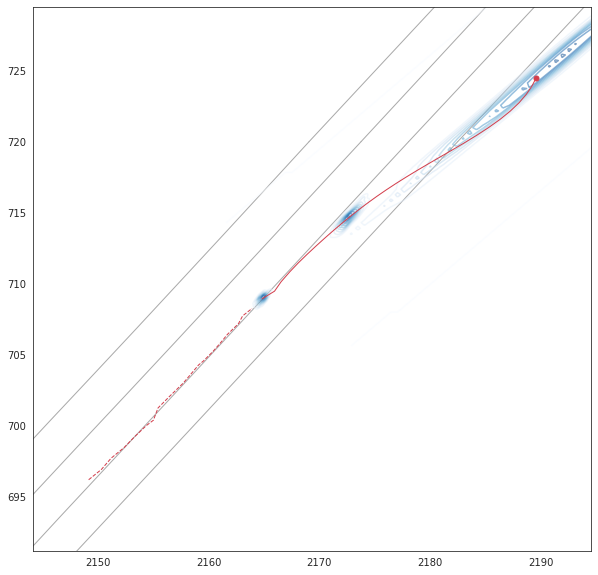

[10242]
[10242]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


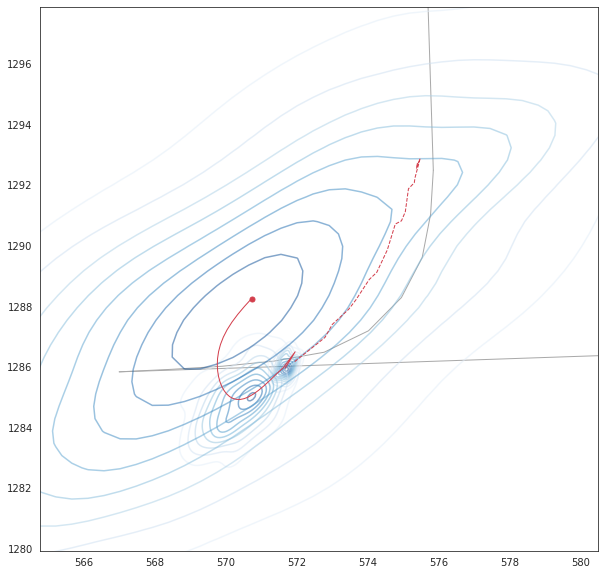

[10250]
[10250]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


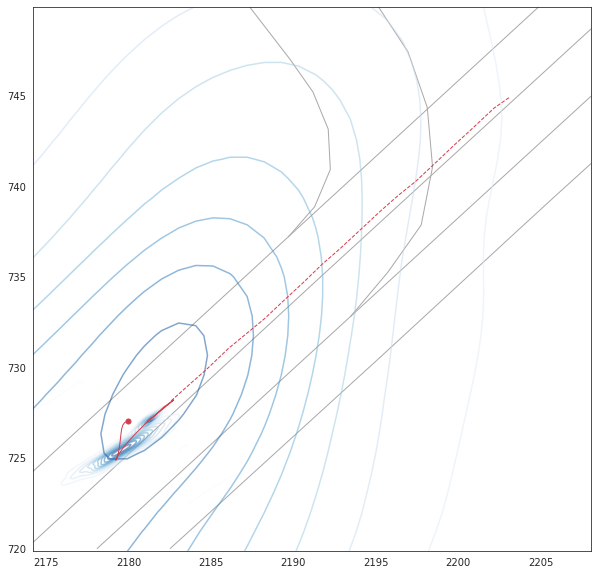

[10251]
[10251]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


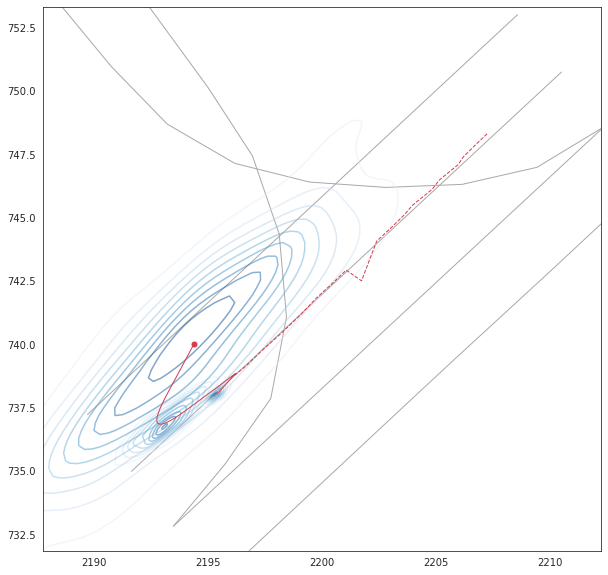

[10278]
[10278]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


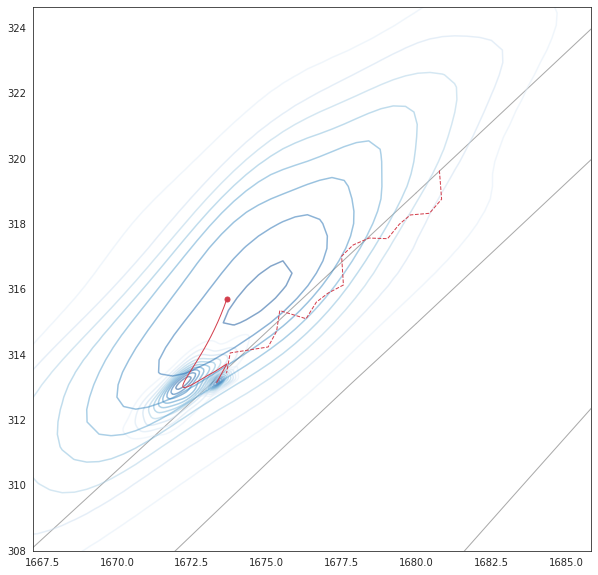

[10279]
[10279]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


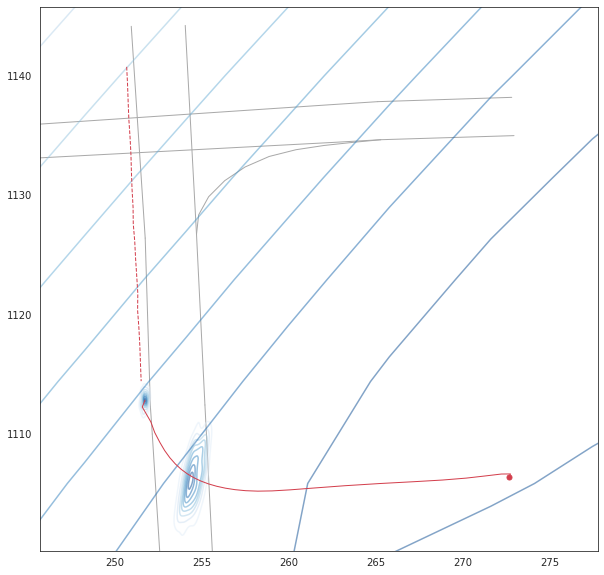

[10281]
[10281]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


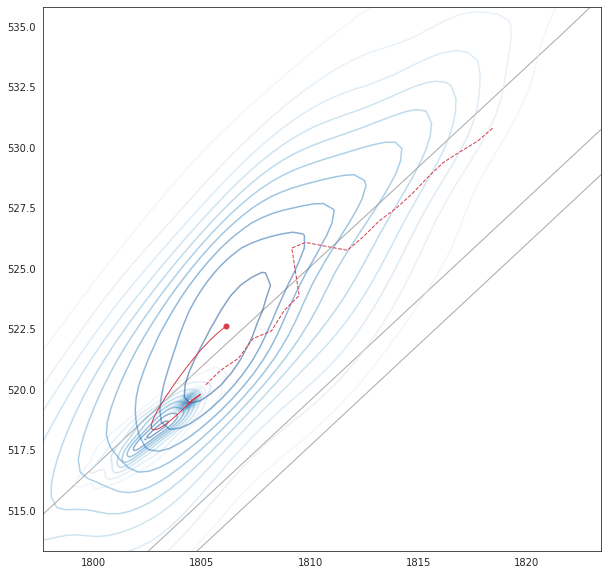

[10298]
[10298]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


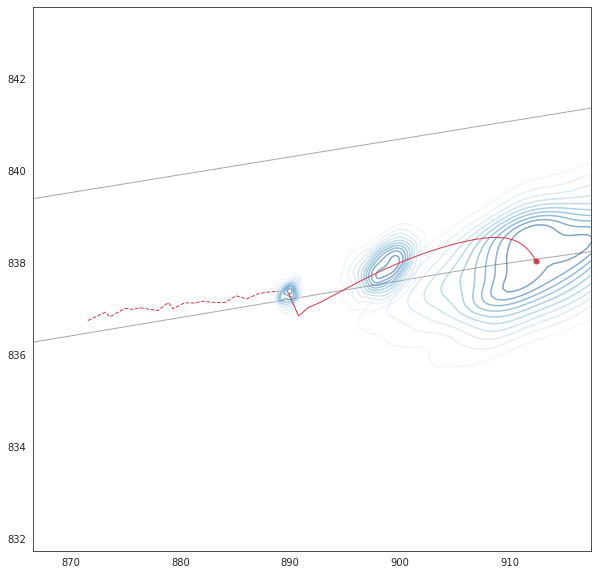

[10303]
[10303]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


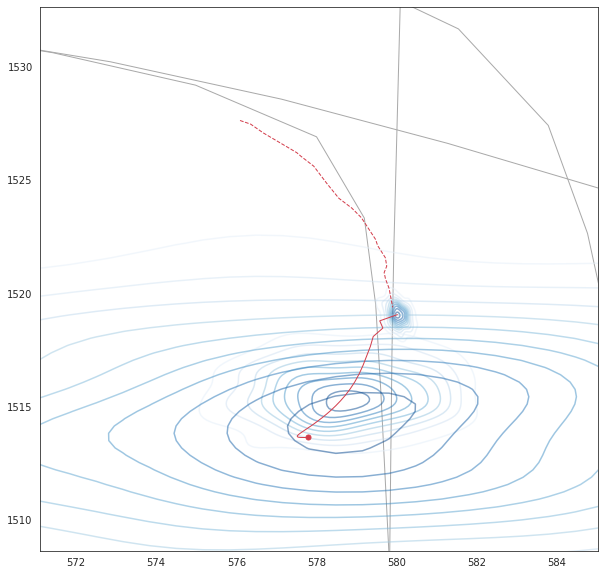

[10312]
[10312]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


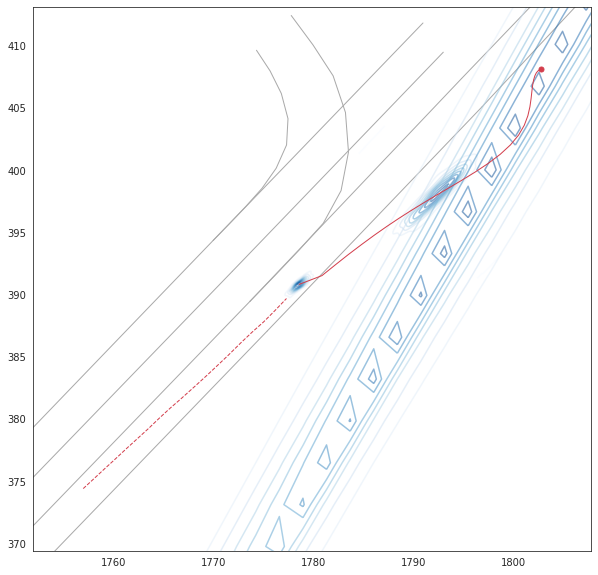

[10313]
[10313]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


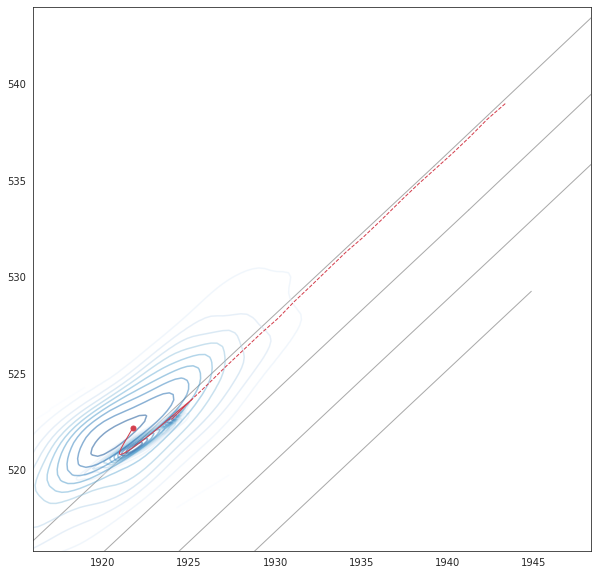

[10317]
[10317]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


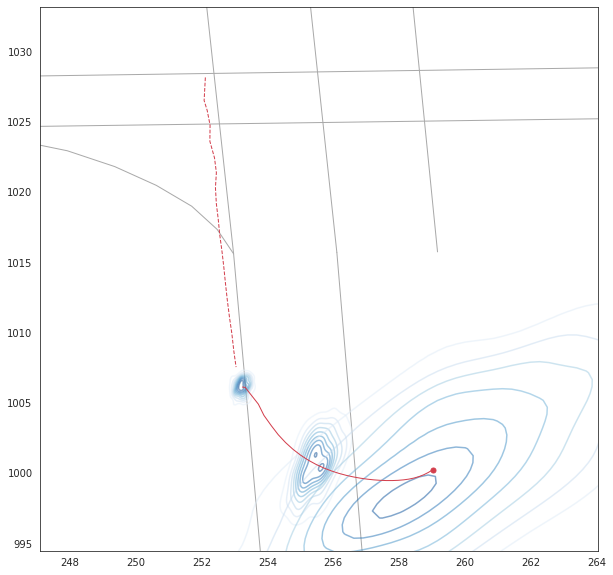

[10340]
[10340]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


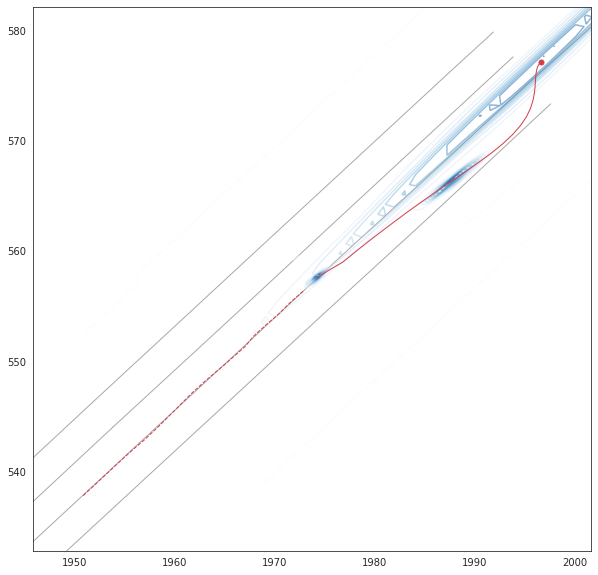

[10355]
[10355]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


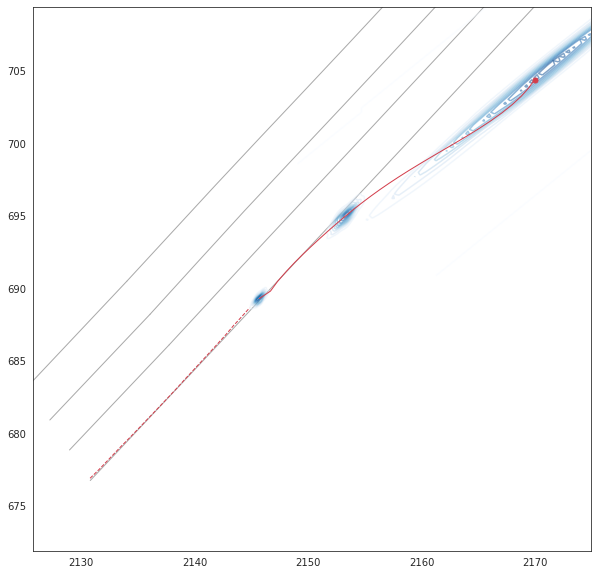

[10357]
[10357]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


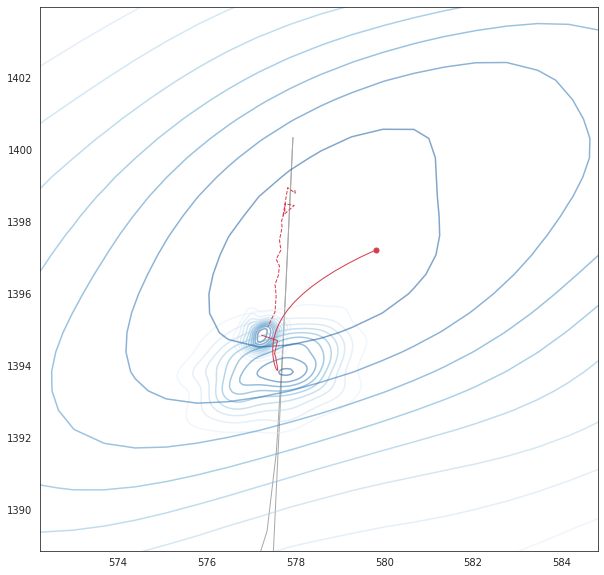

[10360]
[10360]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


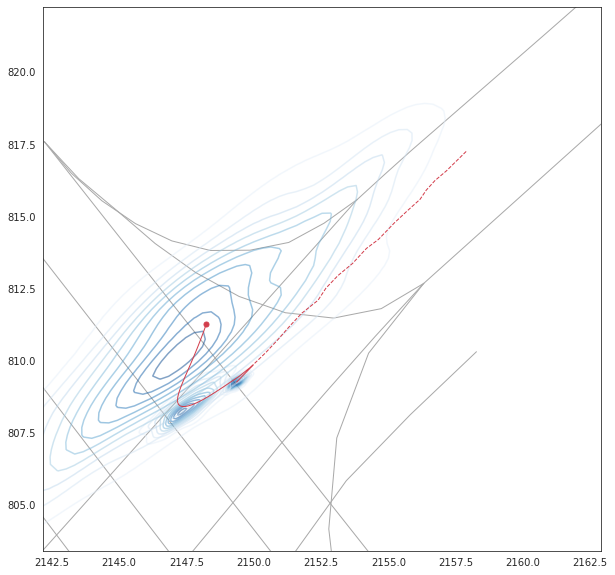

[10374]
[10374]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


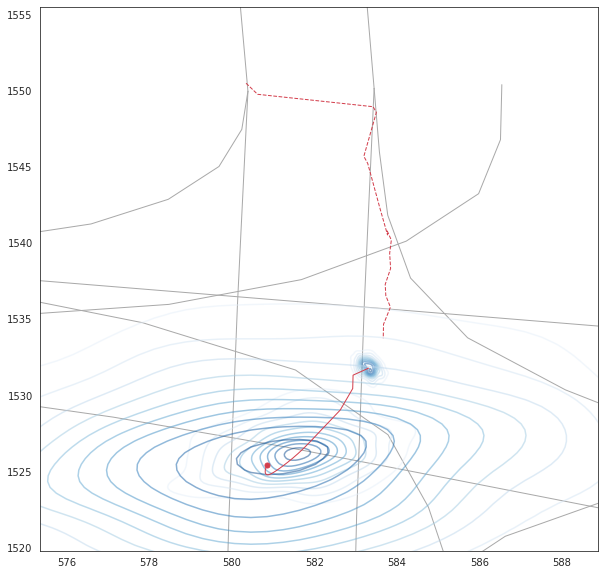

[104]
[104]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


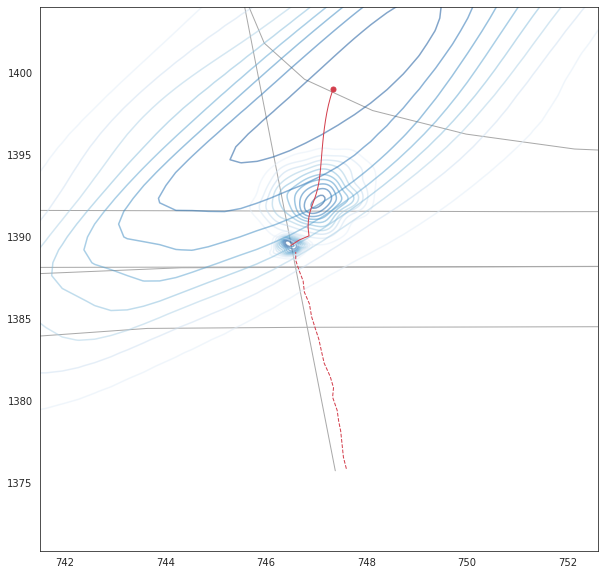

[10413]
[10413]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


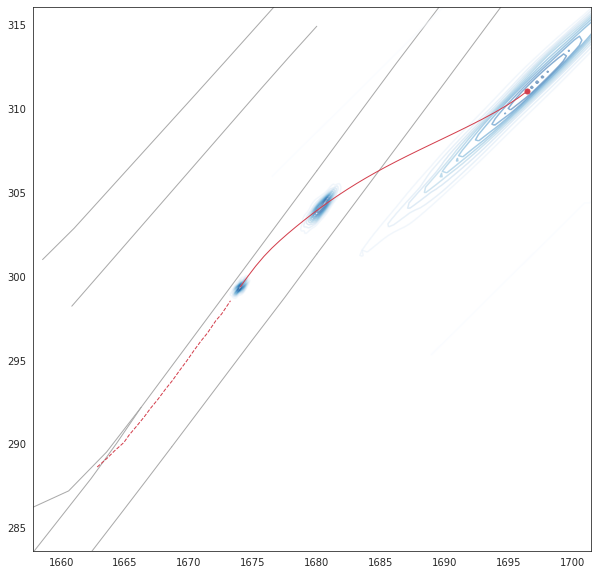

[10439]
[10439]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


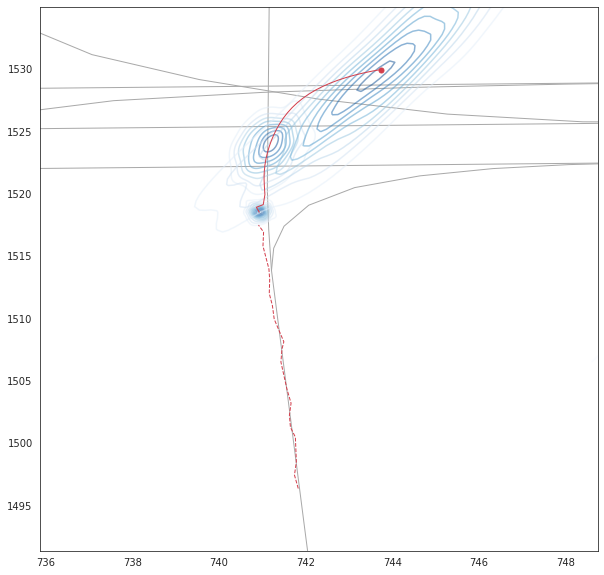

[10449]
[10449]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


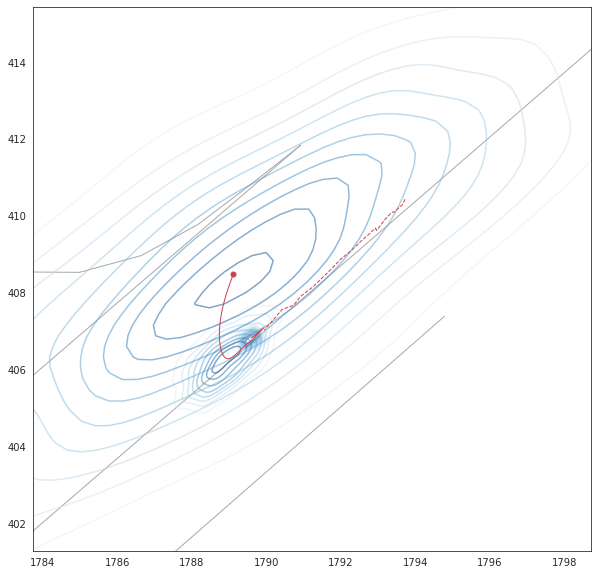

[10467]
[10467]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


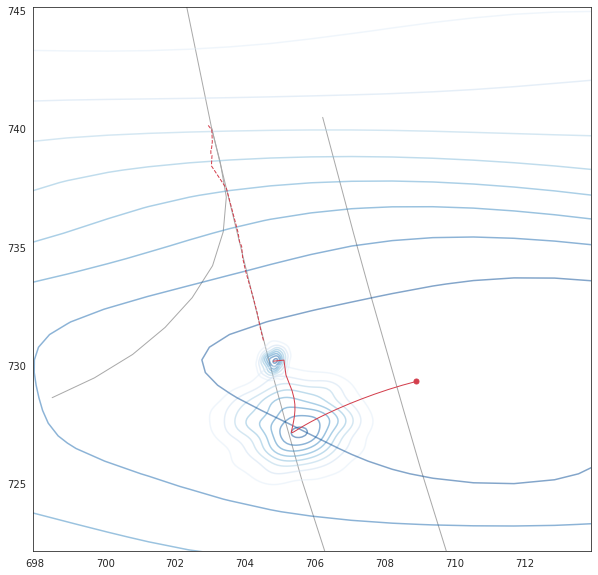

[10472]
[10472]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


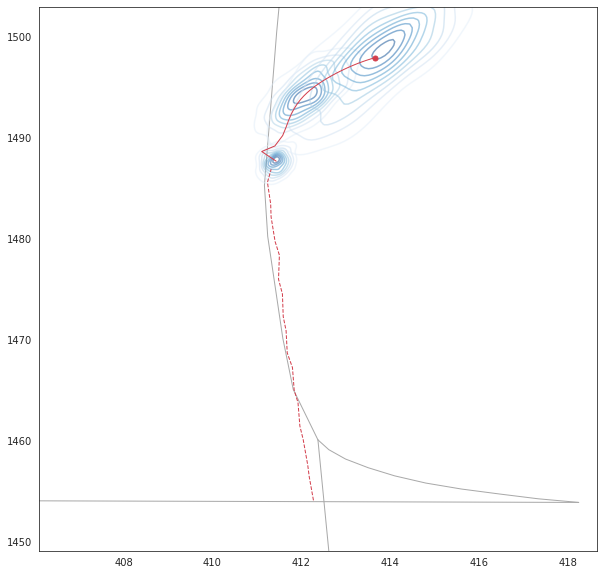

[10474]
[10474]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


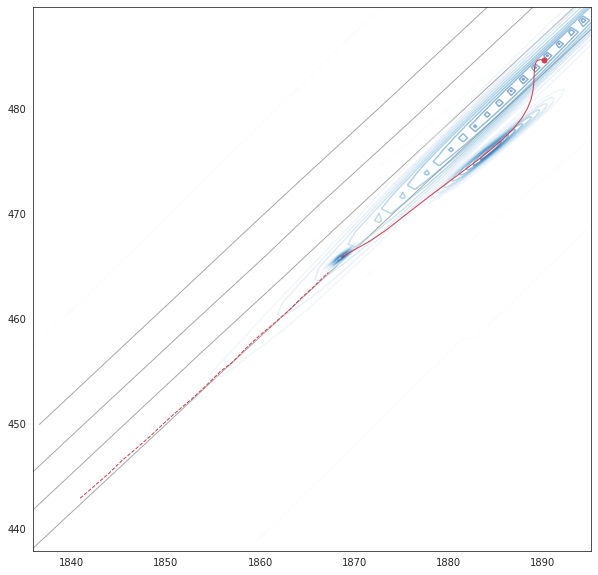

[10487]
[10487]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


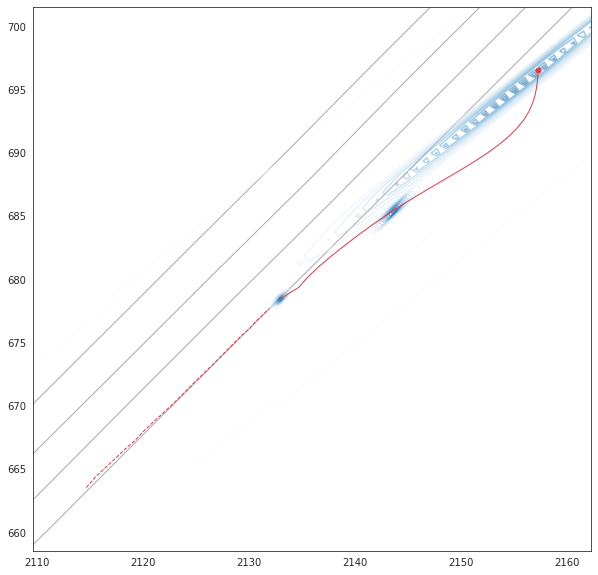

[10495]
[10495]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


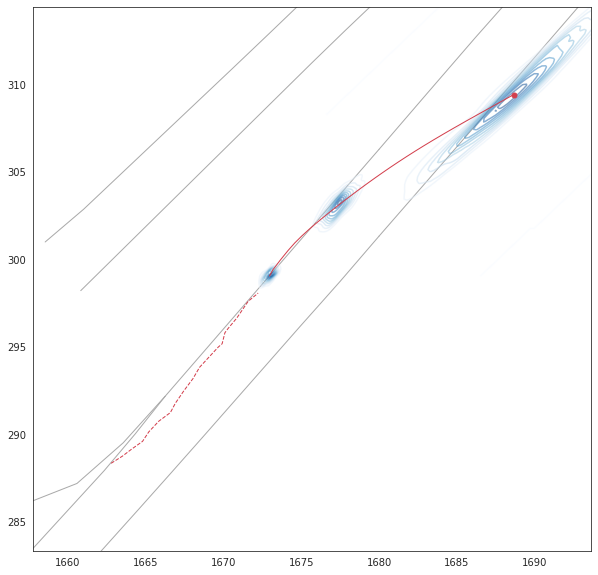

[10517]
[10517]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


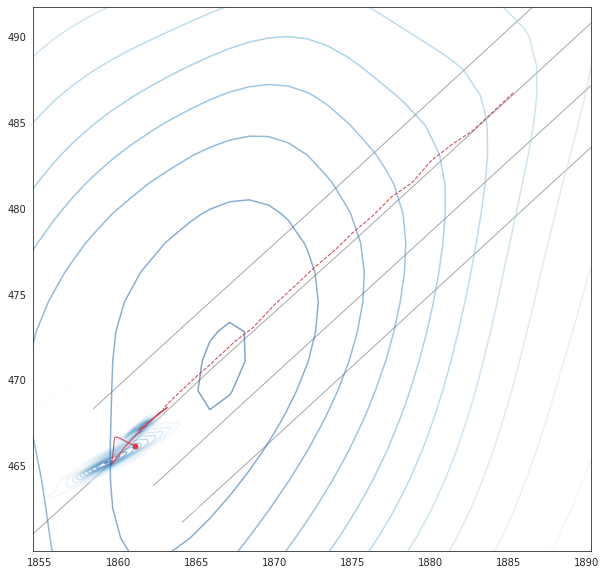

[10521]
[10521]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


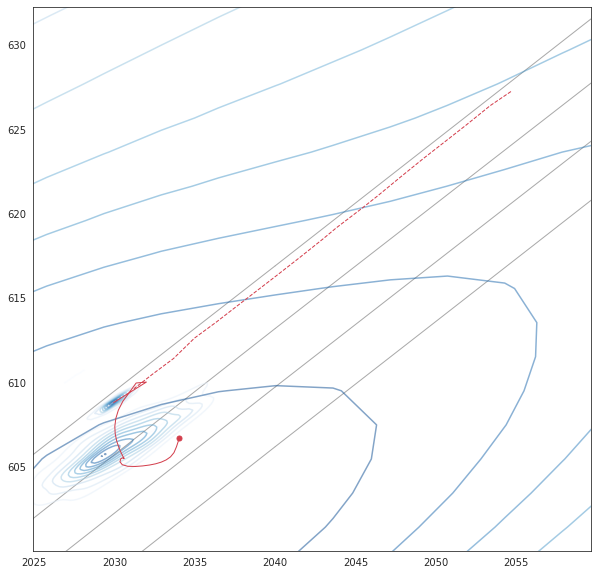

[10523]
[10523]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


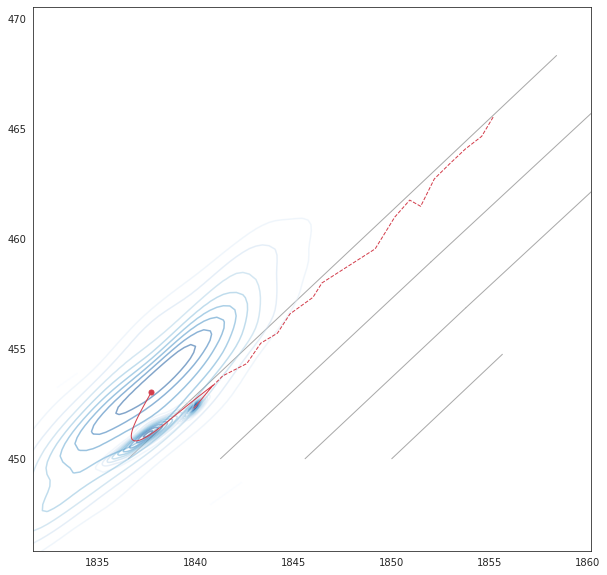

[10535]
[10535]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


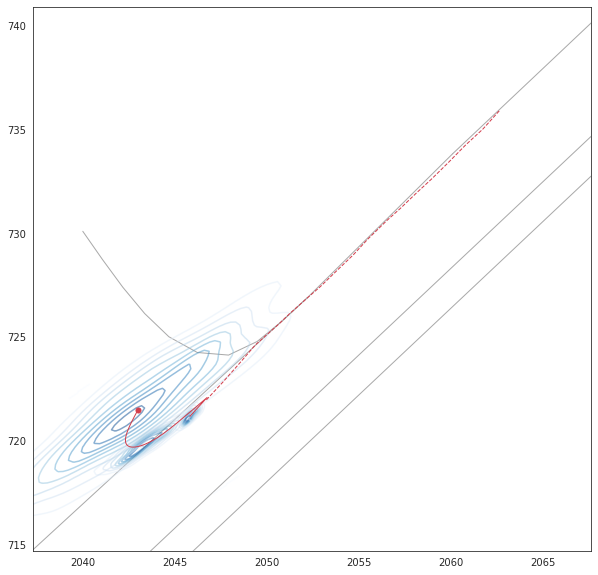

[10545]
[10545]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


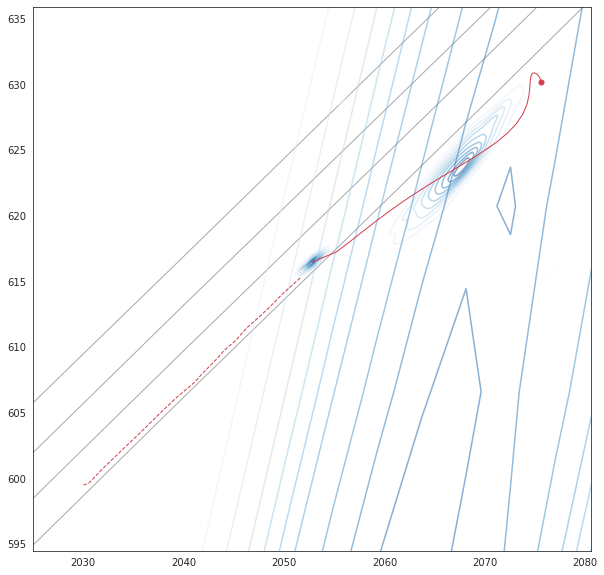

[10560]
[10560]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


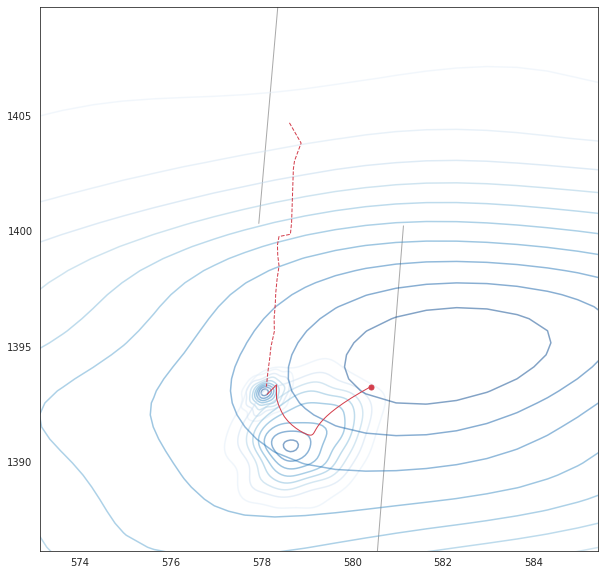

[10561]
[10561]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


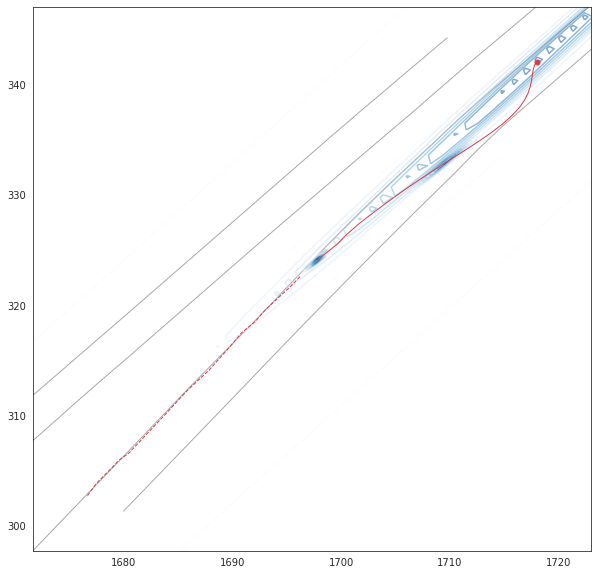

[10589]
[10589]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


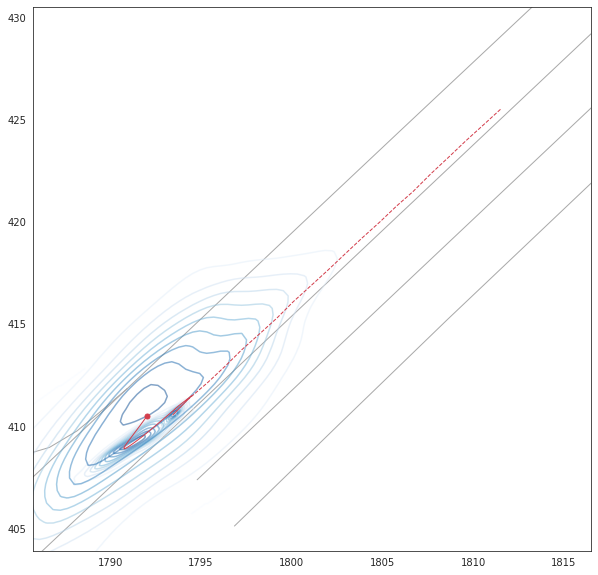

[10605]
[10605]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


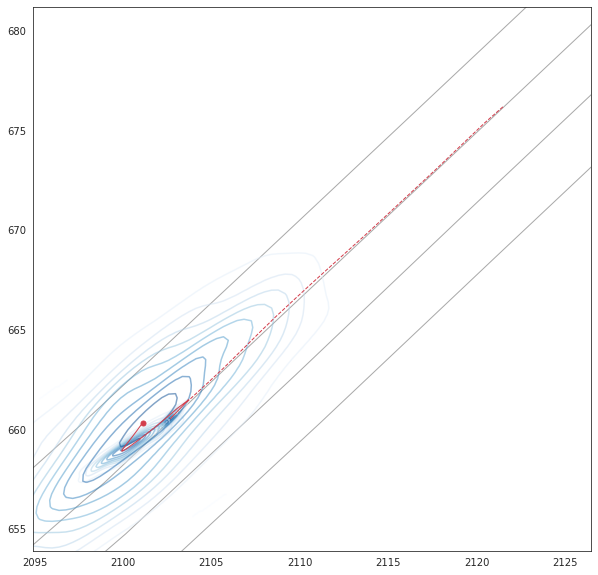

[10646]
[10646]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


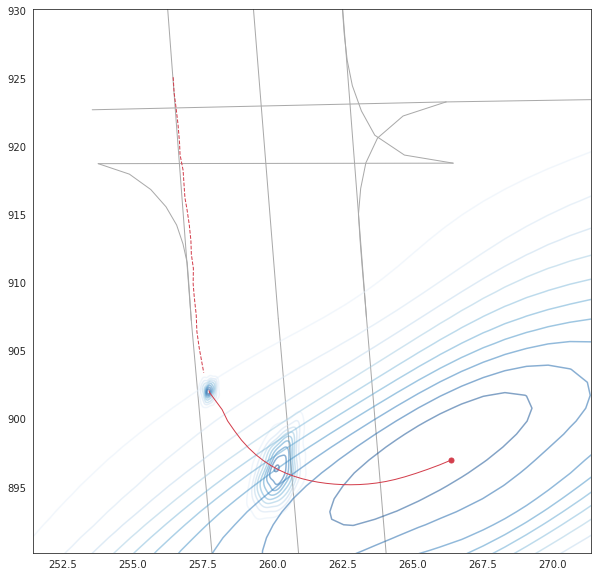

[1065]
[1065]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


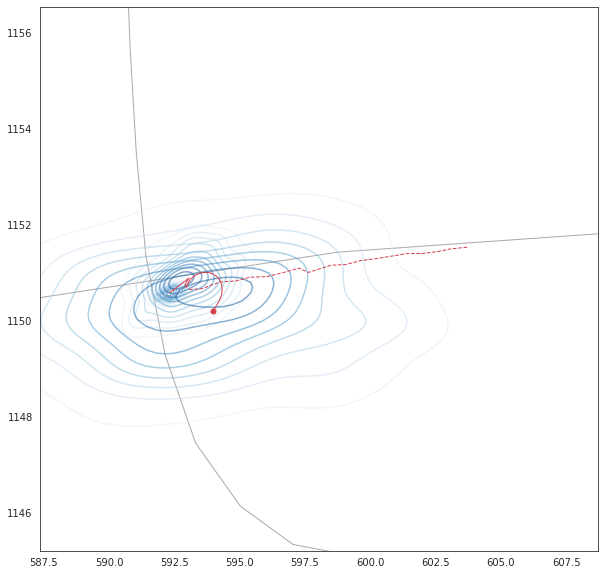

[10662]
[10662]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


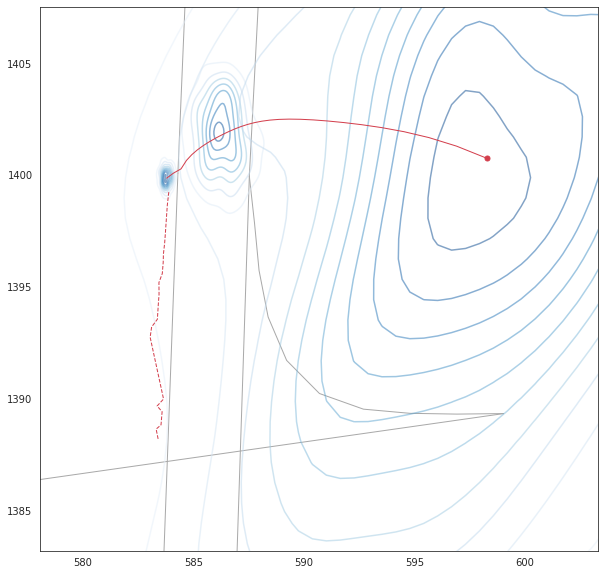

[10693]
[10693]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


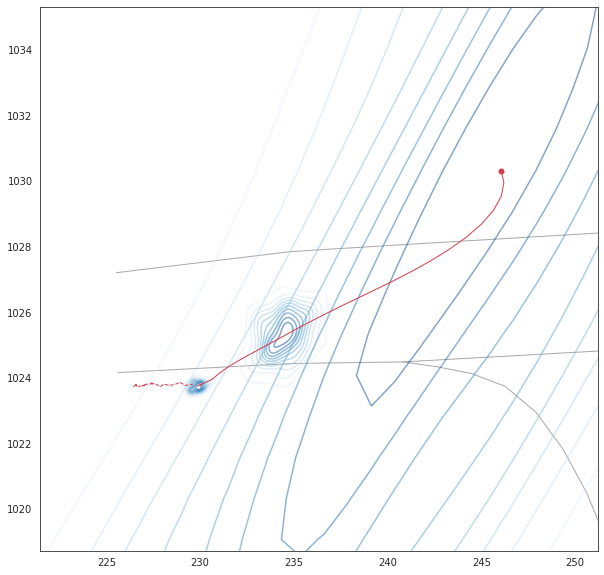

[10699]
[10699]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


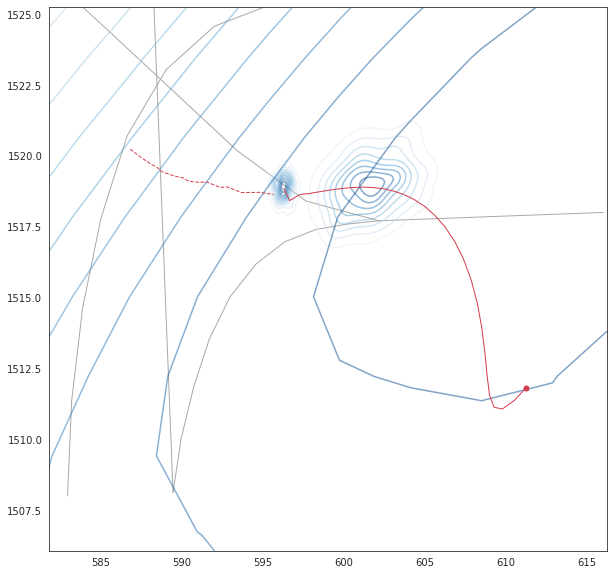

[10701]
[10701]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


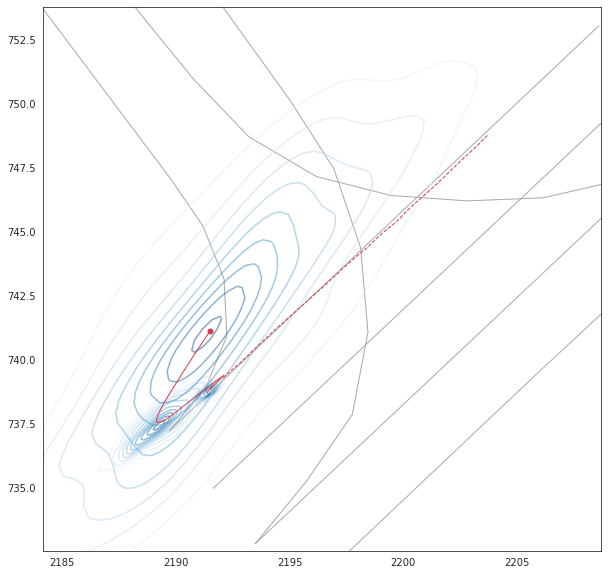

[10705]
[10705]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


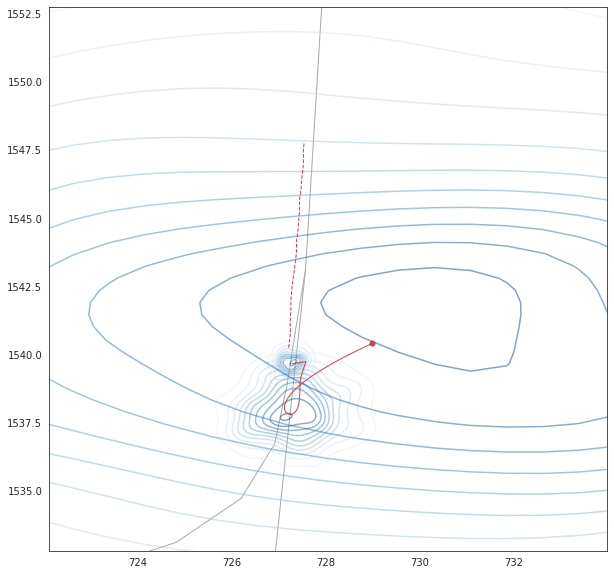

[10750]
[10750]


/home/ss/.local/lib/python3.6/site-packages/seaborn/distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


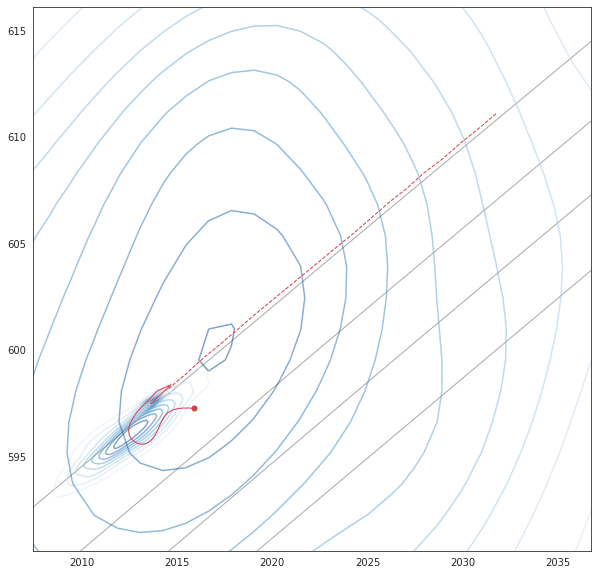

In [199]:
preds = []
i = 0
for valdata in val_dataset:
    i +=1
    df = lstm_pred(valdata, encoder, decoder)
    preds.append((valdata['scene_idx'],df))
    print(valdata['scene_idx'])
    visualize_trajectory(df)
    if i>60:
        break

In [25]:
for df in val_dataset:
    toshow = lstm_pred(df,  encoder, decoder)
    visualize_trajectory(toshow)
    

In [111]:

from shapely.geometry import Point, Polygon, LineString, LinearRing
from shapely.affinity import affine_transform, rotate
def trans(df):
    
    normalized_traj = []
    x_coord_seq = df[:,:,0]
    y_coord_seq = df[:,:,1]

    # Normalize each trajectory
    for i in range(x_coord_seq.shape[0]):
        xy_seq = np.stack((x_coord_seq[i], y_coord_seq[i]), axis=-1)

        start = xy_seq[0]
        # First apply translation
        m = [1, 0, 0, 1, -start[0], -start[1]]
        ls = LineString(xy_seq)


        # Now apply rotation, taking care of edge cases
        ls_offset = affine_transform(ls, m)
       
        # Normalized trajectory
        norm_xy = np.array(ls_offset) #ls_rotate)

        # Update the containers
        normalized_traj.append(norm_xy)
        
    normalize_traj_arr = np.stack(normalized_traj)
    return normalize_traj_arr

def untrans(pred, df):
    
    normalized_traj = []
    x_coord_seq = df[:,:,0]
    y_coord_seq = df[:,:,1]
    
    x_pred_seq = pred[:,:,0]
    y_pred_seq = pred[:,:,1]

    # Normalize each trajectory
    for i in range(x_coord_seq.shape[0]):
        xy_seq = np.stack((x_coord_seq[i], y_coord_seq[i]), axis=-1)
        
        pred_seq = np.stack((x_pred_seq[i], y_pred_seq[i]), axis=-1)
        
        start = xy_seq[0]
        # First apply translation
        m = [1, 0, 0, 1, start[0], start[1]]
        ls = LineString(pred_seq)


        # Now apply rotation, taking care of edge cases
        ls_offset = affine_transform(ls, m)
       
        # Normalized trajectory
        norm_xy = np.array(ls_offset) #ls_rotate)

        # Update the containers
        normalized_traj.append(norm_xy)
        
    normalize_traj_arr = np.stack(normalized_traj)
    normalize_traj_arr = np.concatenate([normalize_traj_arr,pred[:,:,2:]],axis=2 )
    return normalize_traj_arr
    

In [176]:
def construct_df(pos, sig, track_id, agent_id, city,scene_idx):
    obj_type = np.array(['OTHERS'] * len(pos))
    track_id = track_id.squeeze().tolist()
    agent_id = agent_id.squeeze()
    city = city.squeeze()
    sigs = [[s] for s in sig]
    obj_type[track_id == agent_id] = 'AGENT'
    df = pd.DataFrame(data = {'scene_idx': scene_idx,
                               'TRACK_ID': track_id, 
                              'X': pos[:,0], 
                              'Y': pos[:,1], 
                              'sigma': sigs,
                              'OBJECT_TYPE': obj_type, 
                              'CITY_NAME': city})
    return df

In [150]:
df.keys()

dict_keys(['city', 'lane', 'lane_norm', 'scene_idx', 'agent_id', 'car_mask', 'p_in', 'v_in', 'p_out', 'v_out', 'track_id', 'lane_mask'])

In [201]:
def lstm_pred(sample, encoder, decoder):
    data = process_batch(sample, 'cpu')

    agent_id = data['agent_id']
    city = data['city']
    scene = data['scene_idx'][0]
    
    input_length = 19
    output_length = 30
    track_id = sample['track_id'][0]
    agent_idx = np.where(track_id==agent_id)[0][0]
    intraj = sample['p_in'][0][agent_idx,:,:]
    intraj = np.expand_dims(intraj, axis=0)
    normalized = trans(intraj) 

    
    zeros = np.zeros((1, 2, 2))

    prediction0 = construct_df(intraj[:,0,:], zeros, 
                               agent_id, agent_id, 
                               city,scene)
    for i in range(1,19):
        prediction0 = prediction0.append(construct_df(intraj[:,i,:], zeros, 
                               agent_id, agent_id, 
                               city,scene))
    _input = torch.tensor(normalized, device=device, dtype=torch.float32)

    # Set to eval mode
    encoder.eval()
    decoder.eval()

    # Encoder
    batch_size = _input.shape[0]
    input_length = _input.shape[1]
    input_shape = _input.shape[2]

    # Initialize encoder hidden state
    encoder_hidden = model_utils.init_hidden(
        batch_size,
        encoder.module.hidden_size)
    
    with torch.no_grad():
        # Encode observed trajectory
        for ei in range(input_length):
            encoder_input = _input[:, ei, :]
            encoder_hidden = encoder(encoder_input, encoder_hidden)

        # Initialize decoder input with last coordinate in encoder
        decoder_input = torch.cat([encoder_input[:, :2], torch.zeros(batch_size,3,device=encoder_input.device)], dim=1)
        # Initialize decoder hidden state as encoder hidden state
        decoder_hidden = encoder_hidden
        output_shape = list(_input.shape)
        output_shape[-1] = 5
        output_shape[-2] = 30
        decoder_outputs = torch.zeros(output_shape).to(device)

        for di in range(output_length):
            decoder_output, decoder_hidden = decoder(decoder_input,
                                                     decoder_hidden)

            output = Gaussian2d(decoder_output)
            decoder_outputs[:, di, :] = output
    
    decoder_outputs = decoder_outputs.cpu().numpy()
    decoder_outputs = untrans(decoder_outputs, intraj)
    
    for i in range(output_length):
        
        xy, sigma = make_sigma(decoder_outputs[:,i,:])

        prediction0 = prediction0.append(construct_df(xy, sigma.reshape((1,2,2)),
                                           agent_id, agent_id, 
                                           city,scene))

    return prediction0


In [173]:
def make_sigma(pred):
    x_sigma = pred[:,2]
    y_sigma = pred[:,3]
    rho = pred[:,4]
    off_diag = rho * x_sigma * y_sigma
    C = np.array([[np.power(x_sigma,2), off_diag], [off_diag, np.power(y_sigma,2)]])
    return pred[:,:2], C
    
def inputdf(data):

    lane = data['lane']
    lane_normals = data['lane_norm']
    agent_id = data['agent_id']
    city = data['city']
    scenes = data['scene_idx'][0]

    mask =torch.clone(data['car_mask'])[0].cpu().numpy().astype(bool).squeeze(-1)

    zeros = torch.zeros(sum(mask), 2, 2).cpu().numpy()
    track_id =  data['track_id0'][0,mask]
    pos = data['pos_2s'].cpu().numpy()[0]


    prediction0 = construct_df(pos[mask,0], zeros, 
                               data['track_id0'][0][mask], data['agent_id'][0], 
                               data['city'][0],scenes)
    for i in range(1,18):
        prediction0 = prediction0.append(construct_df(pos[mask,i], zeros,
                                                      track_id, data['agent_id'][0], 
                                                      data['city'][0],scenes))
    prediction0 = prediction0.append(construct_df(data['pos0'][0].cpu().numpy()[mask], zeros, 
                                                  track_id, data['agent_id'][0], 
                                                  data['city'][0],scenes))
    return prediction0
    

In [190]:
_ZORDER = {"AGENT": 15, "AV": 10, "OTHERS": 5}

def visualize_trajectory(
    df: pd.DataFrame, lane_centerlines = None, show: bool = True, smoothen: bool = False, 
    gt = True, lims = None
) -> None:
    sns.set_style("white")

    # Seq data
    # time_list = np.sort(np.unique(df["TIMESTAMP"].values))
    city_name = df["CITY_NAME"].values[0]

    lane_centerlines = helper.get_lanes(df, city_name) if lane_centerlines is None else lane_centerlines

    plt.figure(0, figsize=(10, 10))
    
    if lims:
        x_min,x_max,y_min,y_max = lims
    else:
        x_min = min(df["X"])-5
        x_max = max(df["X"])+5
        y_min = min(df["Y"])-5
        y_max = max(df["Y"])+5

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)


    for lane_cl in lane_centerlines:
        plt.plot(lane_cl[:, 0], lane_cl[:, 1], "-", color="darkgrey", alpha=1, linewidth=1, zorder=0)
    frames = df.groupby("TRACK_ID")

    # plt.xlabel("Map X")
    # plt.ylabel("Map Y")

    color_dict = {"AGENT": "#d33e4c", "OTHERS": "deepskyblue", "AV": "deepskyblue"}
    object_type_tracker: Dict[int, int] = defaultdict(int)

    # Plot all the tracks up till current frame
    for group_name, group_data in frames:
        object_type = group_data["OBJECT_TYPE"].values[0]

        cor_x = group_data["X"].values
        cor_y = group_data["Y"].values
        sigmas = [np.array(x[0]) for x in group_data['sigma'].values]

        if smoothen:
            polyline = np.column_stack((cor_x, cor_y))
            num_points = cor_x.shape[0] * 3
            smooth_polyline = interpolate_polyline(polyline, num_points)
            cor_x = smooth_polyline[:, 0]
            cor_y = smooth_polyline[:, 1]

        plt.plot(
            cor_x[:19],
            cor_y[:19],
            "--",
            color=color_dict[object_type],
            label="History",
            alpha=1,
            linewidth=1,
            zorder=_ZORDER[object_type],
        )
        plt.plot(
            cor_x[19:],
            cor_y[19:],
            "-",
            color=color_dict[object_type],
            label="Ground Truth" if gt else "Prediction",
            alpha=1,
            linewidth=1,
            zorder=_ZORDER[object_type],
        )
    

        final_x = cor_x[-1]
        final_y = cor_y[-1]

        if object_type == "AGENT":
            marker_type = "o"
            marker_size = 5
        elif object_type == "OTHERS":
            marker_type = "o"
            marker_size = 5
        elif object_type == "AV":
            marker_type = "o"
            marker_size = 5

        plt.plot(
            final_x,
            final_y,
            marker_type,
            color=color_dict[object_type],
            label='Agent' if object_type == "AGENT" else 'Others',
            alpha=1,
            markersize=marker_size,
            zorder=_ZORDER[object_type],
        )
        
        if object_type =='AGENT':
            for i in [19,29,48]: #range(len(pred)):
                samples = np.random.multivariate_normal([cor_x[i],cor_y[i]], sigmas[i], size=500)
                sns.kdeplot(data=samples, cmap="Blues", shade=False, alpha=0.5) 


        object_type_tracker[object_type] += 1

    red_star = mlines.Line2D([], [], color="red", marker="*", linestyle="None", markersize=7, label="Agent")
    green_circle = mlines.Line2D([], [], color="green", marker="o", linestyle="None", markersize=7, label="Others")
    black_triangle = mlines.Line2D([], [], color="black", marker="^", linestyle="None", markersize=7, label="AV")
    #plt.axis("off")
    
    if show:
        plt.show()

In [20]:
val_features = '../../argoverse_data/val_rose.pkl'

val_dataset = LSTMDataset(val_features, args)
val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=1,
    drop_last=False,
    shuffle=False,
    collate_fn=model_utils.my_collate_fn,
)
print('done')

normalizing
done


In [18]:

parser = argparse.ArgumentParser()
parser.add_argument("--test_batch_size",
                    type=int,
                    default=512,
                    help="Test batch size")
parser.add_argument("--model_path",
                    required=False,
                    type=str,
                    help="path to the saved model")
parser.add_argument("--obs_len",
                    default=19,
                    type=int,
                    help="Observed length of the trajectory")
parser.add_argument("--pred_len",
                    default=30,
                    type=int,
                    help="Prediction Horizon")
parser.add_argument("--name",
                    default='lstm',
                    type=str,
                    help="model name")
parser.add_argument(
    "--rotation",
    action="store_true",
    help="rotationally normalize the trajectories if non-map baseline is used",
)
parser.add_argument(
    "--use_delta",
    action="store_true",
    help="Train on the change in position, instead of absolute position",
)
parser.add_argument(
    "--train_features",
    default="",
    type=str,
    help="path to the file which has train features.",
)
parser.add_argument(
    "--val_features",
    default="",
    type=str,
    help="path to the file which has val features.",
)
parser.add_argument(
    "--test_features",
    default="",
    type=str,
    help="path to the file which has test features.",
)
parser.add_argument(
    "--joblib_batch_size",
    default=100,
    type=int,
    help="Batch size for parallel computation",
)
parser.add_argument("--use_map",
                    action="store_true",
                    help="Use the map based features")
parser.add_argument("--use_social",
                    action="store_true",
                    help="Use social features")
parser.add_argument("--mis_metric",
                    action="store_true",
                    help="Use social features")
parser.add_argument("--test",
                    action="store_true",
                    help="If true, only run the inference")
parser.add_argument("--train_batch_size",
                    type=int,
                    default=512,
                    help="Training batch size")
parser.add_argument("--val_batch_size",
                    type=int,
                    default=512,
                    help="Val batch size")
parser.add_argument("--end_epoch",
                    type=int,
                    default=1000,
                    help="Last epoch")
parser.add_argument("--lr",
                    type=float,
                    default=0.001,
                    help="Learning rate")
parser.add_argument(
    "--traj_save_path",
    required=False,
    type=str,
    help=
    "path to the pickle file where forecasted trajectories will be saved.",
)
import shlex

argString = '--name vis'
args = parser.parse_args(shlex.split(argString))
